# Info
Purpose:

    Describe the details ...

Input:

    arguments

Output:

    Figure and save files

Keywords:

    none

Dependencies:

    - load_utils.py
    - matplotlib
    - numpy
    - Sp_parameters
    - write_utils
    - path_utils
    - hdf5storage
    - scipy

Needed Files:
  - file.rc : for consistent creation of look of matplotlib figures
  - ...

Modification History:

    Written: Samuel LeBlanc, Santa Cruz, CA, 2021-06-01
    Modified:


# Prepare python environment

In [1]:
import numpy as np
import Sp_parameters as Sp
import load_utils as lu
import write_utils as wu
from path_utils import getpath
import hdf5storage as hs
import scipy.io as sio
import matplotlib.pyplot as plt
%matplotlib notebook
import os


In [2]:
import pandas as pd

In [3]:
from scipy.interpolate import UnivariateSpline

In [4]:
name = 'FOG2FIRE'
vv = 'v3'
fp = getpath(name)


Return path named:  FOG2FIRE /data/sam/FOG2FIRE/


# Load files

In [5]:
f = os.listdir(fp)
f.sort()
f

['ABI',
 'Cloud_fraction_vs_fire_count_coast_NorCal_2017_2018_2019.png',
 'Cloud_fraction_vs_soil_moisture_coast_Central_2017_2018_2019.png',
 'Cloud_fraction_vs_soil_moisture_coast_NorCal_2017_2018_2019.png',
 'Cloud_fraction_vs_soil_moisture_coast_NorCal_2017_2018_2019_zoom.png',
 'Cloud_fraction_vs_soil_moisture_points_Big Sur_2017_2018_2019.png',
 'Cloud_fraction_vs_soil_moisture_points_Eldorado_2017_2018_2019.png',
 'Cloud_fraction_vs_soil_moisture_points_Los Padres_2017_2018_2019.png',
 'Cloud_fraction_vs_soil_moisture_points_San Bernardino_2017_2018_2019.png',
 'Cloud_fraction_vs_soil_moisture_points_Santa Cruz_2017_2018_2019.png',
 'Cloud_fraction_vs_soil_moisture_points_Sierra_2017_2018_2019.png',
 'FOG2FIRE_CF_histogram.png',
 'FOG2FIRE_CF_histogram_v3.png',
 'FOG2FIRE_cumCF_fire_counts.png',
 'FOG2FIRE_cumCF_fire_counts_v3.png',
 'MOD06',
 'MOD06_2003_v3.npy',
 'MOD06_2004_v3.npy',
 'MOD06_2005_v3.npy',
 'MOD06_2006_v3.npy',
 'MOD06_2007_v3.npy',
 'MOD06_2008_v3.npy',
 'MOD0

In [6]:
years = ['2003','2004','2005','2006','2007','2008','2009',
         '2010','2011','2012','2013','2014','2015','2016','2017','2018','2019','2020','2021']

## Load the clouds

In [7]:
cld = []
for y in years:
    try:
        c = np.load(fp+'MOD06_{}_{}.npy'.format(y,vv),allow_pickle=True,fix_imports=True,encoding='latin1')
        c = c.item()
    except FileNotFoundError:
        c = {}
    cld.append(c)

In [8]:
cld[1].keys()

dict_keys(['CF', 'surf_temp', 'sza', 'cld_top', 'time', 'regions', 'lbls_rg'])

## Load the fire counts

In [9]:
vy = 'v3'
fir = []
for y in years:
    try:
        i = np.load(fp+'MYD14_{}_{}.npy'.format(y,vy),allow_pickle=True,fix_imports=True,encoding='latin1')
        i = i.item()
    except FileNotFoundError:
        i = {}
    fir.append(i)

In [10]:
fir[0].keys()

dict_keys(['FP', 'regions', 'lbls_rg', 'time'])

In [11]:
print(fir[0]['time'][0])

2003-01-01 19:35:00


In [12]:
for ffi in fir:
    print(ffi['time'][0],' - to - ',ffi['time'][-1])

2003-01-01 19:35:00  - to -  2003-12-31 21:40:00
2004-01-01 20:40:00  - to -  2004-12-31 21:55:00
2005-01-01 19:20:00  - to -  2005-12-31 21:20:00
2006-01-01 18:50:00  - to -  2006-12-31 20:55:00
2007-01-01 19:55:00  - to -  2007-12-31 22:00:00
2008-01-01 19:30:00  - to -  2008-12-31 22:20:00
2009-01-01 19:45:00  - to -  2009-12-31 21:45:00
2010-01-01 20:45:00  - to -  2010-12-31 21:15:00
2011-01-01 20:15:00  - to -  2011-12-31 22:20:00
2012-01-01 19:45:00  - to -  2012-12-31 20:55:00
2013-01-01 19:55:00  - to -  2013-12-31 22:05:00
2014-01-01 21:05:00  - to -  2014-12-31 21:30:00
2015-07-26 20:45:00  - to -  2015-12-31 21:00:00
2016-01-01 20:00:00  - to -  2016-12-31 21:15:00
2017-01-01 20:15:00  - to -  2017-12-31 22:20:00
2018-01-01 19:45:00  - to -  2018-12-31 21:50:00
2019-01-01 20:50:00  - to -  2019-12-31 21:20:00
2020-01-01 20:20:00  - to -  2020-12-31 21:30:00
2021-01-01 20:30:00  - to -  2021-12-31 21:00:00


## Load the soil moisture

In [12]:
sma = []
for y in years:
    try:
        s = np.load(fp+'SMAP_{}_{}.npy'.format(y,vv),allow_pickle=True,fix_imports=True,encoding='latin1')
        s = s.item()
    except FileNotFoundError:
        s = {}
    sma.append(s)

# Plot out data

In [13]:
cld[1]['CF'].keys()

dict_keys(['ocean', 'coast', 'land', 'points'])

In [14]:
cld[1]['CF']['coast'].keys()

dict_keys(['mean', 'median', 'std', 'num'])

In [15]:
cld[1]['CF']['coast']['mean'].shape

(1341, 4)

## Make smoothing and plotting functions

In [16]:
def smooth(x,y,w):
    y = np.array(y)
    x = np.array(x)
    igood = np.isfinite(y)
    fx = UnivariateSpline(x[igood],y[igood],w=w[igood]/max(w),s=104,k=3)
    return fx(x)

In [17]:
from scipy.signal import savgol_filter

In [18]:
import statsmodels.api as sm

In [19]:
def smooth_l(x,y,w):
    y = np.array(y)
    x = np.array(x)
    igood = np.isfinite(y)
    fx = sm.nonparametric.lowess(y[igood],x[igood],frac=0.1)
    return fx[:,0],fx[:,1]

In [20]:
def non_uniform_savgol(x, y, window, polynom):
    """
    Applies a Savitzky-Golay filter to y with non-uniform spacing
    as defined in x

    This is based on https://dsp.stackexchange.com/questions/1676/savitzky-golay-smoothing-filter-for-not-equally-spaced-data
    The borders are interpolated like scipy.signal.savgol_filter would do

    Parameters
    ----------
    x : array_like
        List of floats representing the x values of the data
    y : array_like
        List of floats representing the y values. Must have same length
        as x
    window : int (odd)
        Window length of datapoints. Must be odd and smaller than x
    polynom : int
        The order of polynom used. Must be smaller than the window size

    Returns
    -------
    np.array of float
        The smoothed y values
    """
    if len(x) != len(y):
        raise ValueError('"x" and "y" must be of the same size')

    if len(x) < window:
        raise ValueError('The data size must be larger than the window size')

    if type(window) is not int:
        raise TypeError('"window" must be an integer')

    if window % 2 == 0:
        raise ValueError('The "window" must be an odd integer')

    if type(polynom) is not int:
        raise TypeError('"polynom" must be an integer')

    if polynom >= window:
        raise ValueError('"polynom" must be less than "window"')

    half_window = window // 2
    polynom += 1

    # Initialize variables
    A = np.empty((window, polynom))     # Matrix
    tA = np.empty((polynom, window))    # Transposed matrix
    t = np.empty(window)                # Local x variables
    y_smoothed = np.full(len(y), np.nan)

    # Start smoothing
    for i in range(half_window, len(x) - half_window, 1):
        # Center a window of x values on x[i]
        for j in range(0, window, 1):
            t[j] = x[i + j - half_window] - x[i]

        # Create the initial matrix A and its transposed form tA
        for j in range(0, window, 1):
            r = 1.0
            for k in range(0, polynom, 1):
                A[j, k] = r
                tA[k, j] = r
                r *= t[j]

        # Multiply the two matrices
        tAA = np.matmul(tA, A)

        # Invert the product of the matrices
        tAA = np.linalg.inv(tAA)

        # Calculate the pseudoinverse of the design matrix
        coeffs = np.matmul(tAA, tA)

        # Calculate c0 which is also the y value for y[i]
        y_smoothed[i] = 0
        for j in range(0, window, 1):
            y_smoothed[i] += coeffs[0, j] * y[i + j - half_window]

        # If at the end or beginning, store all coefficients for the polynom
        if i == half_window:
            first_coeffs = np.zeros(polynom)
            for j in range(0, window, 1):
                for k in range(polynom):
                    first_coeffs[k] += coeffs[k, j] * y[j]
        elif i == len(x) - half_window - 1:
            last_coeffs = np.zeros(polynom)
            for j in range(0, window, 1):
                for k in range(polynom):
                    last_coeffs[k] += coeffs[k, j] * y[len(y) - window + j]

    # Interpolate the result at the left border
    for i in range(0, half_window, 1):
        y_smoothed[i] = 0
        x_i = 1
        for j in range(0, polynom, 1):
            y_smoothed[i] += first_coeffs[j] * x_i
            x_i *= x[i] - x[half_window]

    # Interpolate the result at the right border
    for i in range(len(x) - half_window, len(x), 1):
        y_smoothed[i] = 0
        x_i = 1
        for j in range(0, polynom, 1):
            y_smoothed[i] += last_coeffs[j] * x_i
            x_i *= x[i] - x[-half_window - 1]

    return y_smoothed

In [21]:
def gaussian_sum_smooth(xdata, ydata, xeval, sigma, null_thresh=0.6):
    """Apply gaussian sum filter to data.

    xdata, ydata : array
        Arrays of x- and y-coordinates of data. 
        Must be 1d and have the same length.

    xeval : array
        Array of x-coordinates at which to evaluate the smoothed result

    sigma : float
        Standard deviation of the Gaussian to apply to each data point
        Larger values yield a smoother curve.

    null_thresh : float
        For evaluation points far from data points, the estimate will be
        based on very little data. If the total weight is below this threshold,
        return np.nan at this location. Zero means always return an estimate.
        The default of 0.6 corresponds to approximately one sigma away 
        from the nearest datapoint.
    """
    # Distance between every combination of xdata and xeval
    # each row corresponds to a value in xeval
    # each col corresponds to a value in xdata
    delta_x = xeval[:, None] - xdata

    # Calculate weight of every value in delta_x using Gaussian
    # Maximum weight is 1.0 where delta_x is 0
    weights = np.exp(-0.5 * ((delta_x / sigma) ** 2))

    # Multiply each weight by every data point, and sum over data points
    smoothed = np.dot(weights, ydata)

    # Nullify the result when the total weight is below threshold
    # This happens at evaluation points far from any data
    # 1-sigma away from a data point has a weight of ~0.6
    nan_mask = weights.sum(1) < .6
    smoothed[nan_mask] = np.nan

    # Normalize by dividing by the total weight at each evaluation point
    # Nullification above avoids divide by zero warning shere
    smoothed = smoothed / weights.sum(1)


    return smoothed

In [22]:
def smooth_s(x,y,w=25,p=4):
    y = np.array(y)
    x = np.array(x)
    igood = np.isfinite(y)
    if len(y[igood])<w:
        yp = y[igood]+np.nan
    else:
        yp = non_uniform_savgol(x[igood],y[igood],w,p)
    return x[igood],yp

In [23]:
def smooth_g(x,y,s=0.1):
    y = np.array(y)
    x = np.array(x)
    igood = np.isfinite(y)
    yp = gaussian_sum_smooth(x[igood],y[igood],x[igood],s)
    return x[igood],yp

## Plot out the CF time series

In [34]:
for j in range(4):
    for i,yy in enumerate(years):
        if cld[i]:
            for c in cld[i]['CF'].keys():
                if not 'dev' in  cld[i]['CF'][c]:
                    cld[i]['CF'][c]['dev'] = np.zeros_like(cld[i]['CF'][c]['mean']) 
                cld[i]['CF'][c]['dev'][:,j] = np.nancumsum(cld[i]['CF'][c]['mean'][:,j]-np.nanmean(cld[i]['CF'][c]['mean'][:,j]))

In [35]:
cld[i]['lbls_rg']

{'ocean': ['SoCal', 'Central', 'NorCal', 'Oregon'],
 'coast': ['SoCal', 'Central', 'NorCal', 'Oregon'],
 'land': ['SoCal', 'Central Sierras', 'Northern Sierras', 'Oregon mountains'],
 'points': ['San Diego',
  'San Bernardino',
  'Los Padres',
  'Big Sur',
  'Sierra',
  'Santa Cruz',
  'Eldorado',
  'Mendocino',
  'Lassen-Shasta',
  'Klamath',
  'Rogue',
  'Mt Hood',
  'Portland',
  'Olympic',
  'Mt. Baker-Rainier']}

### Compare singular cloud fraction and soil moisture for particular regions

<IPython.core.display.Javascript object>


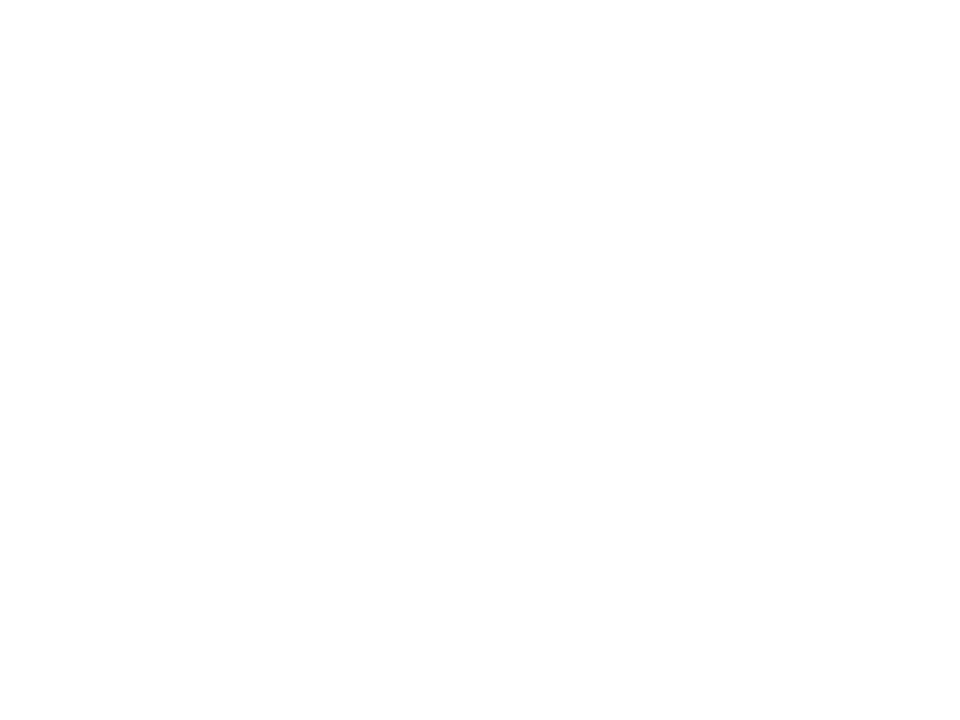

NameError: name 'sma' is not defined

In [36]:
plt.figure()
i = 17
j = 2

rg = 'coast'
doyc = [t.timetuple().tm_yday+t.hour/24.0+t.minute/3600.0 for t in cld[i]['time']]
doys = [t.timetuple().tm_yday+t.hour/24.0+t.minute/3600.0 for t in sma[i]['time']]
plt.plot(doyc,cld[i]['CF'][rg]['dev'][:,j],'.',label='Cloud Fraction')
plt.plot([0],[0],'+',label='Soil Moisture',c='tab:blue')
ax = plt.gca()
axx = plt.gca().twinx()
axx.plot(doys,sma[i]['SM'][rg]['mean'][:,j],'+',label='Soil Moisture',c='tab:blue')
for i in [14,15,16,17,18,19]:
    doyc = [t.timetuple().tm_yday+t.hour/24.0+t.minute/3600.0 for t in cld[i]['time']]
    doys = [t.timetuple().tm_yday+t.hour/24.0+t.minute/3600.0 for t in sma[i]['time']]
    ax.plot(doyc,cld[i]['CF'][rg]['dev'][:,j],'.',label=years[i])
    axx.plot(doys,sma[i]['SM'][rg]['mean'][:,j],'+')
    
ax.legend()
#plt.xlim(datetime(2019,1,1),datetime(2020,1,1))

ax.set_xlabel('Day of year')
ax.set_ylabel('Cumulative change in Cloud Fraction (MODIS Terra)')
axx.set_ylabel('Soil Moisture [cm$^3_{{H20}}$/cm$^3$] (SMAP)')

ax.set_title('US West - '+ rg + ' - '+cld[i]['lbls_rg'][rg][j])

plt.savefig(fp+'Cloud_fraction_vs_soil_moisture_{}_{}_2017_2018_2019.png'.format(rg,cld[i]['lbls_rg'][rg][j]),dpi=600,transparent=True)

In [181]:
years[i]

'2020'

In [37]:
sma[i]

NameError: name 'sma' is not defined

<IPython.core.display.Javascript object>


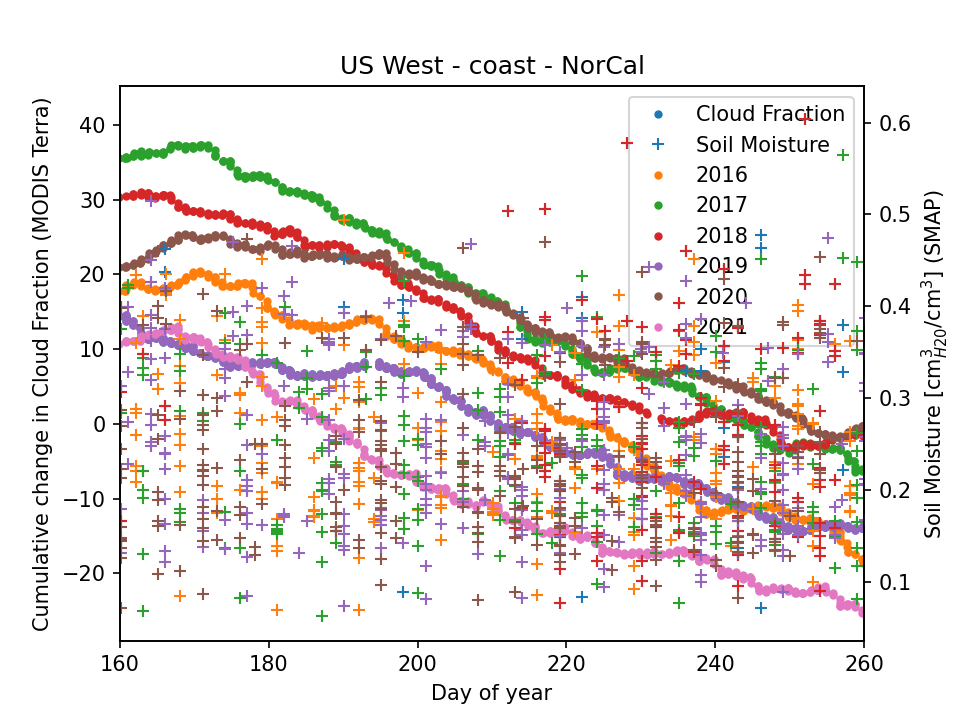

In [185]:
plt.figure()
i = 17
j = 2

rg = 'coast'
doyc = [t.timetuple().tm_yday+t.hour/24.0+t.minute/3600.0 for t in cld[i]['time']]
doys = [t.timetuple().tm_yday+t.hour/24.0+t.minute/3600.0 for t in sma[i]['time']]
plt.plot(doyc,cld[i]['CF'][rg]['dev'][:,j],'.',label='Cloud Fraction')
plt.plot([0],[0],'+',label='Soil Moisture',c='tab:blue')
ax = plt.gca()
axx = plt.gca().twinx()
axx.plot(doys,sma[i]['SM'][rg]['mean'][:,j],'+',label='Soil Moisture',c='tab:blue')
for i in [14,15,16,17,18,19]:
    doyc = [t.timetuple().tm_yday+t.hour/24.0+t.minute/3600.0 for t in cld[i]['time']]
    doys = [t.timetuple().tm_yday+t.hour/24.0+t.minute/3600.0 for t in sma[i]['time']]
    ax.plot(doyc,cld[i]['CF'][rg]['dev'][:,j],'.',label=years[i])
    axx.plot(doys,sma[i]['SM'][rg]['mean'][:,j],'+')
    
ax.legend()
ax.set_xlim(160,260)

ax.set_xlabel('Day of year')
ax.set_ylabel('Cumulative change in Cloud Fraction (MODIS Terra)')
axx.set_ylabel('Soil Moisture [cm$^3_{{H20}}$/cm$^3$] (SMAP)')

ax.set_title('US West - '+ rg + ' - '+cld[i]['lbls_rg'][rg][j])

plt.savefig(fp+'Cloud_fraction_vs_soil_moisture_{}_{}_2017_2018_2019_zoom.png'.format(rg,cld[i]['lbls_rg'][rg][j]),dpi=600,transparent=True)

For analysis of the soil miosture compared to cloud fraction. 
Sent to Emma Yates, Laura Iraci, Ju-Mee Rui on 2022-02-07  


Hi, 
  
I decided to take a look at possible connections between the cloud fraction on the west coast and the soil moisture. I wanted to see if that could be applicable to help forecast in the subseasonal scales. I used the MODIS Terra (10:30 am) cloud fraction, and the SMAP Soil Moisture (from the passive Radiometer). I looked at various regions in the west coast, but unlike what I expected, there seems to be an inverse correlation between the cumulative difference in mean cloud fraction and the soil moisture. See attached here for 3 years of regionally averaged daily values (one for the los padres forest, and another for the general Northern California coast - north of San Fran) . It's a bit messy, but I think that goes against my idea of applying to the A.50 call, with a reimagination of my previous FOG2FIRE proposal.  
  
I'm not exactly sure what is happening here and why a disappearance of clouds lead to more soil moisture (mostly at the surface), but it looks like the seasonal features are the strongest.   

### Compare multiple regions cloud fraction and fire counts

<IPython.core.display.Javascript object>


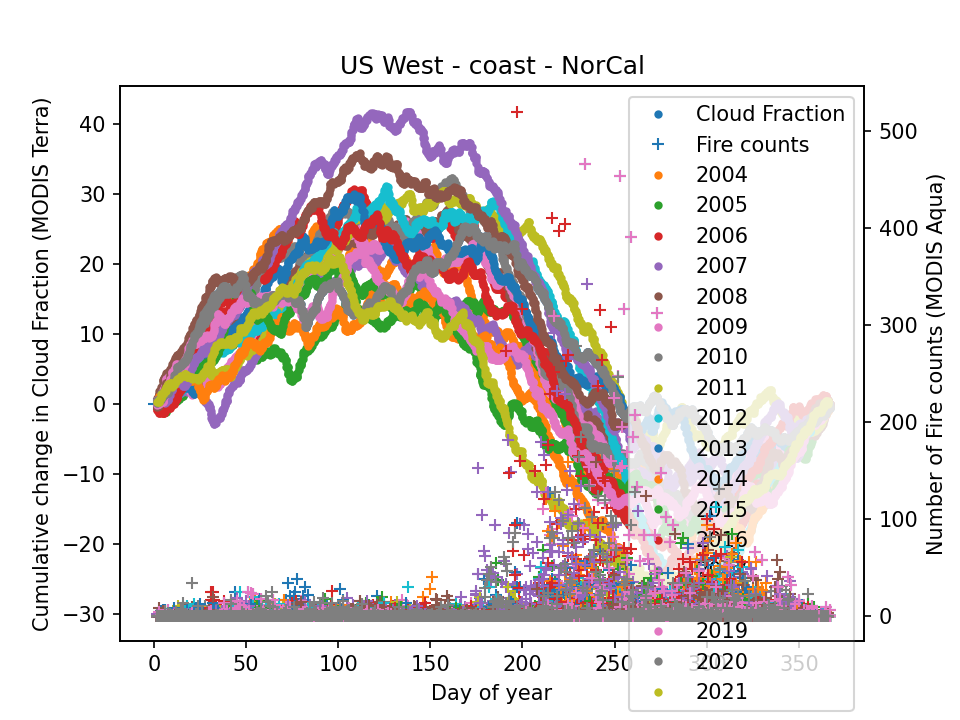

Text(0.5, 1.0, 'US West - coast - NorCal')

In [38]:
plt.figure()
i = 17
j = 2

rg = 'coast'
doyc = [t.timetuple().tm_yday+t.hour/24.0+t.minute/3600.0 for t in cld[i]['time']]
doys = [t.timetuple().tm_yday+t.hour/24.0+t.minute/3600.0 for t in fir[i]['time']]
plt.plot(doyc,cld[i]['CF'][rg]['dev'][:,j],'.',label='Cloud Fraction')
plt.plot([0],[0],'+',label='Fire counts',c='tab:blue')
ax = plt.gca()
axx = plt.gca().twinx()
axx.plot(doys,fir[i]['FP'][rg]['num'][:,j],'+',label='Fire counts',c='tab:blue')
for i in range(1,19):
    doyc = [t.timetuple().tm_yday+t.hour/24.0+t.minute/3600.0 for t in cld[i]['time']]
    doys = [t.timetuple().tm_yday+t.hour/24.0+t.minute/3600.0 for t in fir[i]['time']]
    ax.plot(doyc,cld[i]['CF'][rg]['dev'][:,j],'.',label=years[i])
    axx.plot(doys,fir[i]['FP'][rg]['num'][:,j],'+')
    
ax.legend()
#plt.xlim(datetime(2019,1,1),datetime(2020,1,1))

ax.set_xlabel('Day of year')
ax.set_ylabel('Cumulative change in Cloud Fraction (MODIS Terra)')
axx.set_ylabel('Number of Fire counts (MODIS Aqua)')

ax.set_title('US West - '+ rg + ' - '+cld[i]['lbls_rg'][rg][j])

#plt.savefig(fp+'Cloud_fraction_vs_fire_count_{}_{}_2017_2018_2019.png'.format(rg,cld[i]['lbls_rg'][rg][j]),dpi=600,transparent=True)

<IPython.core.display.Javascript object>


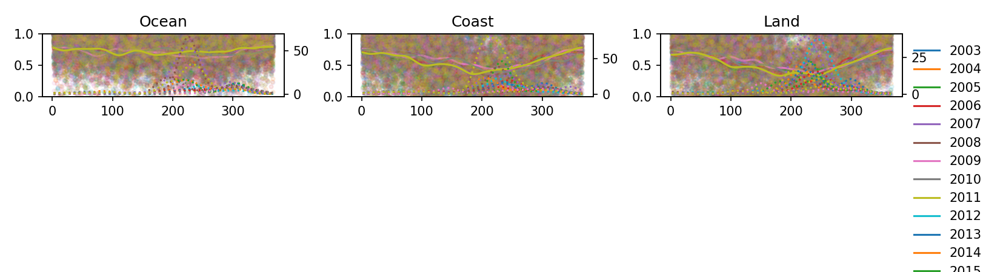

<IPython.core.display.Javascript object>


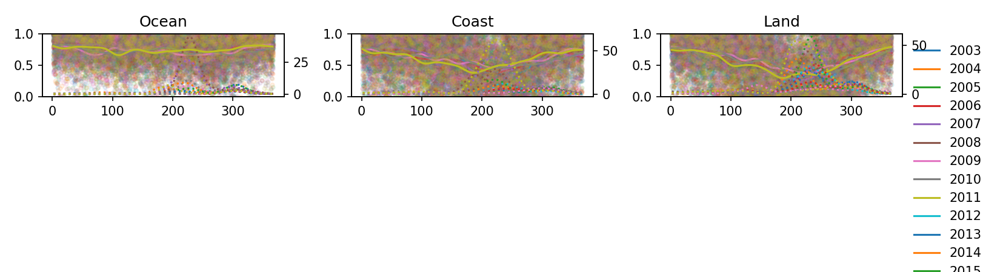

<IPython.core.display.Javascript object>


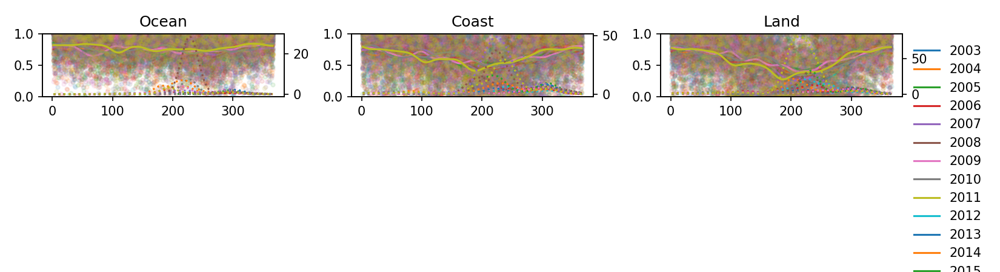

<IPython.core.display.Javascript object>


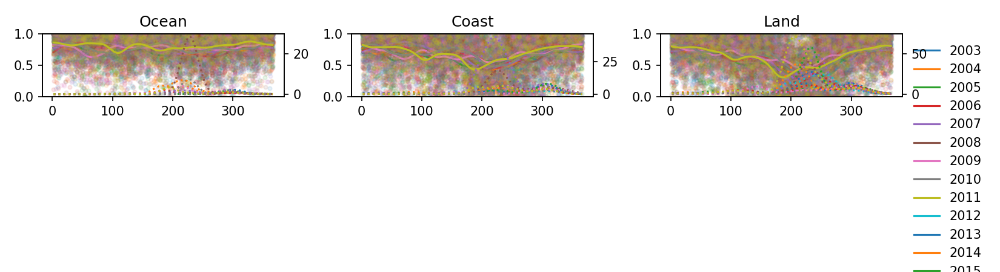

In [39]:
for j in range(4):

    fig, ax = plt.subplots(1,3,figsize=(11,3))
    axx = [axs.twinx() for axs in ax]
    for i,yy in enumerate(years):
        if cld[i]:
            doy = [t.timetuple().tm_yday+t.hour/24.0+t.minute/3600.0 for t in cld[i]['time']]

            p = ax[0].plot(doy,cld[i]['CF']['ocean']['mean'][:,j],'.',alpha=0.1)
            #x,y = savgol_filter((doy,cld[i]['CF']['coast']['mean'][:,0]),25,3)
            #x,y = smooth_l(doy,cld[i]['CF']['coast']['mean'][:,0],1)
            #x,y = smooth_s(doy,cld[i]['CF']['coast']['mean'][:,0],w=125,p=3)
            x,y = smooth_g(doy,cld[i]['CF']['ocean']['mean'][:,j],s=12.0)
            ax[0].plot(x,y,'-',c=p[0].get_color(),label=yy)

            ax[1].plot(doy,cld[i]['CF']['coast']['mean'][:,j],'.',alpha=0.1,c=p[0].get_color())
            x,y = smooth_g(doy,cld[i]['CF']['coast']['mean'][:,j],s=12.0)
            ax[1].plot(x,y,'-',c=p[0].get_color(),label=yy)

            ax[2].plot(doy,cld[i]['CF']['land']['mean'][:,j],'.',alpha=0.1,c=p[0].get_color())
            x,y = smooth_g(doy,cld[i]['CF']['land']['mean'][:,j],s=12.0)
            ax[2].plot(x,y,'-',c=p[0].get_color(),label=yy)

            if fir[i]:
                doyf = [t.timetuple().tm_yday+t.hour/24.0+t.minute/3600.0 for t in fir[i]['time']]
                #axx[0].plot(doyf,fir[i]['FP']['ocean']['num'][:,0],'+',alpha=0.1,c=p[0].get_color())
                x,y = smooth_g(doyf,fir[i]['FP']['ocean']['num'][:,j],s=12.0)
                axx[0].plot(x,y,':',c=p[0].get_color())
                x,y = smooth_g(doyf,fir[i]['FP']['coast']['num'][:,j],s=12.0)
                axx[1].plot(x,y,':',c=p[0].get_color())
                x,y = smooth_g(doyf,fir[i]['FP']['land']['num'][:,j],s=12.0)
                axx[2].plot(x,y,':',c=p[0].get_color())

    nul = [axs.set_ylim([0,1]) for axs in ax]
    ax[2].legend(frameon=False,bbox_to_anchor=(1.0,1.0) )
    ax[0].set_title('Ocean')
    ax[1].set_title('Coast')
    ax[2].set_title('Land')
    plt.tight_layout()

## Get some statistics for fire and cloudiness

In [45]:
for i in range(0,19):
    fir[i]['thresholds'] = {}
    fir[i]['doy'] = [t.timetuple().tm_yday+t.hour/24.0+t.minute/3600.0 for t in fir[i]['time']]

In [44]:
#fir_times = [{}] # timing stats that indicate max, above background timing, and threhold limits for each year.
background_maxdoy = 100.0 # upper time limit for background number of fires
for i in range(1,19):
    fir[i]['thresholds'] = {}
    fir[i]['doy'] = [t.timetuple().tm_yday+t.hour/24.0+t.minute/3600.0 for t in fir[i]['time']]
    for rg in fir[i]['FP'].keys():
        fir[i]['thresholds'][rg] = np.zeros((11,len(fir[i]['lbls_rg'][rg])))+np.nan
        for j,l in enumerate(fir[i]['lbls_rg'][rg]):
            def doy_at(x):
                try:
                    i_sub = np.where(np.array(fir[i]['FP'][rg]['num'][:,j])>x)[0][0]
                    return fir[i]['doy'][i_sub]
                except:
                    return np.nan
            back = np.nanmax(fir[i]['FP'][rg]['num'][np.array(fir[i]['doy'])<background_maxdoy,j])
            above_back = doy_at(back) #fir[i]['doy'][np.where(fir[i]['FP'][rg]['num'][:,j]>back)[0][0]]
            above_back_plus = doy_at(back*1.2) #fir[i]['doy'][np.where(fir[i]['FP'][rg]['num'][:,j]>back*1.2)[0][0]]
            above_20 = doy_at(20.0) #fir[i]['doy'][np.where(fir[i]['FP'][rg]['num'][:,j]>20.0)[0][0]]
            above_50 = doy_at(50.0)
            above_mean = doy_at(np.nanmean(fir[i]['FP'][rg]['num'][:,j]))
            above_median = doy_at(np.nanmedian(fir[i]['FP'][rg]['num'][:,j]) )
            above_75p = doy_at(np.nanpercentile(fir[i]['FP'][rg]['num'][:,j],75.0))
            above_90p = doy_at(np.nanpercentile(fir[i]['FP'][rg]['num'][:,j],90.0))
            above_99p = doy_at(np.nanpercentile(fir[i]['FP'][rg]['num'][:,j],99.0))
            above_995p = doy_at(np.nanpercentile(fir[i]['FP'][rg]['num'][:,j],99.5))
            maxt = fir[i]['doy'][np.nanargmax(fir[i]['FP'][rg]['num'][:,j])]
            
            fir[i]['thresholds'][rg][0,j] = above_back
            fir[i]['thresholds'][rg][1,j] = above_back_plus
            fir[i]['thresholds'][rg][2,j] = above_20
            fir[i]['thresholds'][rg][3,j] = above_50
            fir[i]['thresholds'][rg][4,j] = above_mean
            fir[i]['thresholds'][rg][5,j] = above_median
            fir[i]['thresholds'][rg][6,j] = above_75p
            fir[i]['thresholds'][rg][7,j] = above_90p
            fir[i]['thresholds'][rg][8,j] = above_99p
            fir[i]['thresholds'][rg][9,j] = above_995p
            fir[i]['thresholds'][rg][10,j] = maxt
                            
            

ValueError: zero-size array to reduction operation fmax which has no identity

In [ ]:
#fir_times = [{}] # timing stats that indicate max, above background timing, and threhold limits for each year.
background_maxdoy = 100.0 # upper time limit for background number of fires
for i in range(1,19):
    cld[i]['thresholds'] = {}
    cld[i]['doy'] = [t.timetuple().tm_yday+t.hour/24.0+t.minute/3600.0 for t in cld[i]['time']]
    for rg in cld[i]['CF'].keys():
        cld[i]['thresholds'][rg] = np.zeros((11,len(cld[i]['lbls_rg'][rg])))+np.nan
        for j,l in enumerate(cld[i]['lbls_rg'][rg]):
            def doy_at(x):
                try:
                    i_sub = np.argmin(abs(cld[i]['CF'][rg]['mean'][:,j])-x)
                    return cld[i]['doy'][i_sub]
                except:
                    return np.nan
            back = np.nanmax(cld[i]['CF'][rg]['mean'][np.array(cld[i]['doy'])<background_maxdoy,j])
            above_back = doy_at(back) #fir[i]['doy'][np.where(fir[i]['FP'][rg]['num'][:,j]>back)[0][0]]
            above_back_plus = doy_at(back*1.2) #fir[i]['doy'][np.where(fir[i]['FP'][rg]['num'][:,j]>back*1.2)[0][0]]
            above_20 = doy_at(20.0) #fir[i]['doy'][np.where(fir[i]['FP'][rg]['num'][:,j]>20.0)[0][0]]
            above_50 = doy_at(50.0)
            above_mean = doy_at(np.nanmean(cld[i]['CF'][rg]['mean'][:,j]))
            above_median = doy_at(np.nanmedian(cld[i]['CF'][rg]['mean'][:,j]) )
            above_75p = doy_at(np.nanpercentile(cld[i]['CF'][rg]['mean'][:,j],75.0))
            above_90p = doy_at(np.nanpercentile(cld[i]['CF'][rg]['mean'][:,j],90.0))
            above_99p = doy_at(np.nanpercentile(cld[i]['CF'][rg]['mean'][:,j],99.0))
            above_995p = doy_at(np.nanpercentile(cld[i]['CF'][rg]['mean'][:,j],99.5))
            maxt = fir[i]['doy'][np.nanargmax(cld[i]['CF'][rg]['mean'][:,j])]
            
            cld[i]['thresholds'][rg][0,j] = above_back
            cld[i]['thresholds'][rg][1,j] = above_back_plus
            cld[i]['thresholds'][rg][2,j] = above_20
            cld[i]['thresholds'][rg][3,j] = above_50
            cld[i]['thresholds'][rg][4,j] = above_mean
            cld[i]['thresholds'][rg][5,j] = above_median
            cld[i]['thresholds'][rg][6,j] = above_75p
            cld[i]['thresholds'][rg][7,j] = above_90p
            cld[i]['thresholds'][rg][8,j] = above_99p
            cld[i]['thresholds'][rg][9,j] = above_995p
            cld[i]['thresholds'][rg][10,j] = maxt
                            
            

## CF Histogram for each region

In [42]:
txts = ['Oregon','NorCal','Central','SoCal']

In [43]:
cf = {}
for u in ['ocean','coast','land']:
    cf[u] = [[],[],[],[]]

In [44]:
for u in ['ocean','coast','land']:
    for j in range(4): 
        for i,yy in enumerate(years):
            if cld[i]:
                cf[u][j].append(cld[i]['CF'][u]['mean'][:,j])
        cf[u][j] = np.hstack(cf[u][j])

<IPython.core.display.Javascript object>


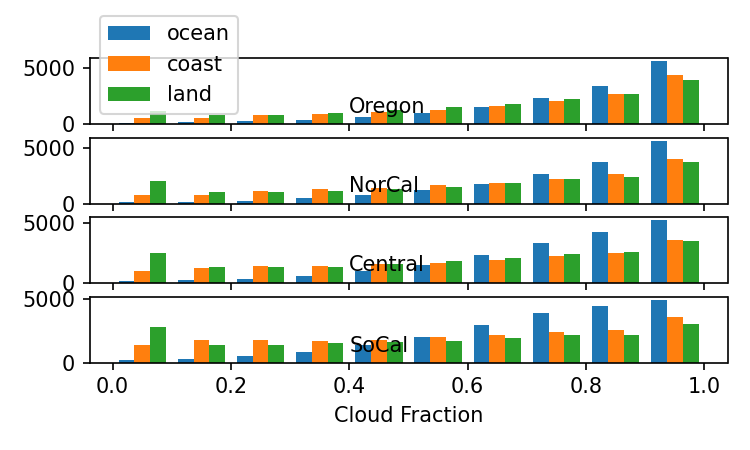

In [45]:
fig,axs = plt.subplots(4,1,sharex=True,figsize=(5,3))

for j,ax in enumerate(axs): 
    ax.hist([cf['ocean'][3-j],cf['coast'][3-j],cf['land'][3-j]],label=['ocean','coast','land'])
    if j==0: ax.legend(frameon=True)
    if j==3: 
        ax.set_xlabel('Cloud Fraction')
    if j==3: 
        ax.text(0.4,800,txts[j])
    else:
        ax.text(0.4,1000,txts[j])
plt.tight_layout(h_pad=-0.2)
plt.savefig(fp+'FOG2FIRE_CF_histogram_{}.png'.format(vv),dpi=600,transparent=True)

## Time series of CF and fire count

<IPython.core.display.Javascript object>


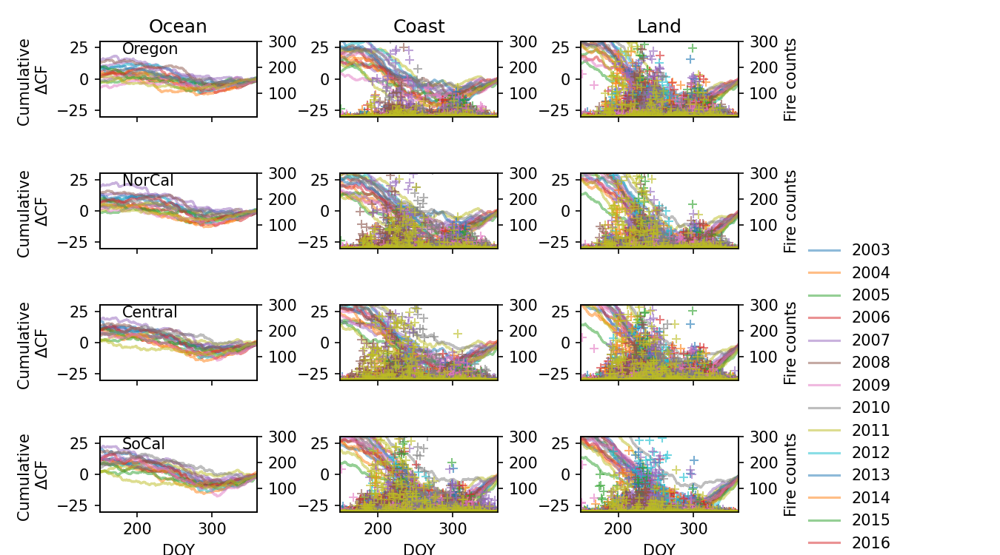

<ipython-input-48-fc9f3482436a>:63: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations
  plt.tight_layout(rect=(0,0,0.98,1),h_pad=-10.0,w_pad=0.0)


In [48]:
fig, ax = plt.subplots(4,3,figsize=(9,5.0))
for j in range(4):    
    axx = [axs.twinx() for axs in ax[j,:]]
    for i,yy in enumerate(years):
        if fir[i]:
            doyf = [t.timetuple().tm_yday+t.hour/24.0+t.minute/3600.0 for t in fir[i]['time']]
            fir[i]['doy'] = np.array(doyf)
        if cld[i]:
            doy = [t.timetuple().tm_yday+t.hour/24.0+t.minute/3600.0 for t in cld[i]['time']]
            cld[i]['doy'] = np.array(doy)

            p = ax[j,0].plot(doy,cld[i]['CF']['ocean']['dev'][:,3-j],'-',alpha=0.5,label=yy)
            ax[j,0].set_ylabel('Cumulative \n$\Delta$CF')
            #x,y = savgol_filter((doy,cld[i]['CF']['coast']['mean'][:,0]),25,3)
            #x,y = smooth_l(doy,cld[i]['CF']['coast']['mean'][:,0],1)x/
            #x,y = smooth_s(doy,cld[i]['CF']['coast']['mean'][:,0],w=125,p=3)
            #x,y = smooth_g(doy,cld[i]['CF']['ocean']['mean'][:,j],s=12.0)
            #ax[0].plot(x,y,'-',c=p[0].get_color(),label=yy)

            ax[j,1].plot(doy,cld[i]['CF']['coast']['dev'][:,3-j],'-',alpha=0.5,c=p[0].get_color(),label=yy)
            #x,y = smooth_g(doy,cld[i]['CF']['coast']['mean'][:,j],s=12.0)
            #ax[1].plot(x,y,'-',c=p[0].get_color(),label=yy)

            ax[j,2].plot(doy,cld[i]['CF']['land']['dev'][:,3-j],'-',alpha=0.5,c=p[0].get_color(),label=yy)
            if j>=3:
                ax[j,0].set_xlabel('DOY')
                ax[j,1].set_xlabel('DOY')
                ax[j,2].set_xlabel('DOY')
            else:
                ax[j,0].set_xticklabels([])
                ax[j,1].set_xticklabels([])
                ax[j,2].set_xticklabels([])
            #x,y = smooth_g(doy,cld[i]['CF']['land']['mean'][:,j],s=12.0)
            #ax[2].plot(x,y,'-',c=p[0].get_color(),label=yy)

            if fir[i]:
                
                doyf = [t.timetuple().tm_yday+t.hour/24.0+t.minute/3600.0 for t in fir[i]['time']]
                fir[i]['doy'] = np.array(doyf)
                #axx[0].plot(doyf,fir[i]['FP']['ocean']['num'][:,3-j],'+',alpha=0.6,c=p[0].get_color())
                axx[1].plot(doyf,fir[i]['FP']['coast']['num'][:,3-j],'+',alpha=0.6,c=p[0].get_color())
                axx[2].plot(doyf,fir[i]['FP']['land']['num'][:,3-j],'+',alpha=0.6,c=p[0].get_color())
                axx[2].set_ylabel('Fire counts')
                #x,y = smooth_g(doyf,fir[i]['FP']['ocean']['num'][:,j],s=12.0)
                #axx[0].plot(x,y,'+',c=p[0].get_color())
                #x,y = smooth_g(doyf,fir[i]['FP']['coast']['num'][:,j],s=12.0)
                #axx[1].plot(x,y,'+',c=p[0].get_color())
                #x,y = smooth_g(doyf,fir[i]['FP']['land']['num'][:,j],s=12.0)
                #axx[2].plot(x,y,'+',c=p[0].get_color())
                nul = [axs.set_ylim([10,300]) for axs in axx]

    nul = [axs.set_ylim([-30,30]) for axs in ax[j,:]]
    nul = [axs.set_xlim([150,360]) for axs in ax[j,:]]
    ax[j,0].text(180,20,txts[j])
    
    if j==2:
        ax[j,2].plot(doy[0],[0],'+',alpha=0.6,c='grey',label='Fire #')
        ax[j,2].legend(frameon=False,bbox_to_anchor=(2.1,2.0),loc=1)
    if j==0:
        ax[j,0].set_title('Ocean')
        ax[j,1].set_title('Coast')
        ax[j,2].set_title('Land')
    plt.tight_layout(rect=(0,0,0.98,1),h_pad=-10.0,w_pad=0.0)
plt.savefig(fp+'FOG2FIRE_cumCF_fire_counts_{}.png'.format(vv),dpi=600,transparent=True)

In [49]:
for j in range(4):    
    for i,yy in enumerate(years):
        for t in ['ocean','coast','land']:
            if cld[i]:
                doy = [t.timetuple().tm_yday+t.hour/24.0+t.minute/3600.0 for t in cld[i]['time']]
                cld[i]['doy'] = np.array(doy)

                ic = (cld[i]['CF'][t]['dev'][:,3-j]<-1.0)&(cld[i]['doy']>150)
                ic2 = (cld[i]['CF'][t]['dev'][:,3-j]<-5.0)&(cld[i]['doy']>150)
                #if any(ic):print('CLD :',j,yy,'[-1]',t,doy[np.where(ic)[0][0]])
                #if any(ic2):print('CLD :',j,yy,'[-5]',t,doy[np.where(ic)[0][0]])
            if fir[i]:
                doyf = [t.timetuple().tm_yday+t.hour/24.0+t.minute/3600.0 for t in fir[i]['time']]
                fir[i]['doy'] = np.array(doyf)
                iff = (fir[i]['FP'][t]['num'][:,3-j]>15)&(fir[i]['doy']>150.0)
                iff2 = (fir[i]['FP'][t]['num'][:,3-j]>35)&(fir[i]['doy']>150.0)
                #if any(iff): print('FIRE:',j,yy,'.15.',t,doyf[np.where(iff)[0][0]])
                #if any(iff2): print('FIRE:',j,yy,'.35.',t,doyf[np.where(iff2)[0][0]])
                if cld[i] and any(ic) and any(iff):
                    print(j,yy,t,'cld:[-1]',doy[np.where(ic)[0][0]],'fir:[15]',doyf[np.where(iff)[0][0]],
                          'fir:[max]',doyf[np.argmax(fir[i]['FP'][t]['num'][:,3-j])])
                    if any(ic2):
                        print('.','....',t,'cld:[-5]',doy[np.where(ic2)[0][0]])
                    if any(iff2):
                        print('.','....',t,'fir:[35]',doyf[np.where(iff2)[0][0]])

0 2003 ocean cld:[-1] 272.84166666666664 fir:[15] 303.8833333333333 fir:[max] 303.8833333333333
. .... ocean cld:[-5] 307.875
0 2003 coast cld:[-1] 240.76388888888889 fir:[15] 209.87916666666666 fir:[max] 303.8833333333333
. .... coast cld:[-5] 244.83472222222224
. .... coast fir:[35] 213.84722222222223
0 2003 land cld:[-1] 230.80694444444444 fir:[15] 155.8375 fir:[max] 233.8402777777778
. .... land cld:[-5] 240.76527777777778
. .... land fir:[35] 197.84722222222223
0 2004 ocean cld:[-1] 179.76527777777778 fir:[15] 174.89027777777778 fir:[max] 227.92083333333332
. .... ocean cld:[-5] 222.8375
. .... ocean fir:[35] 175.875
0 2004 coast cld:[-1] 211.84166666666667 fir:[15] 176.83472222222224 fir:[max] 301.8777777777778
. .... coast cld:[-5] 223.79722222222222
. .... coast fir:[35] 178.88333333333333
0 2004 land cld:[-1] 211.76527777777778 fir:[15] 179.84305555555557 fir:[max] 224.83472222222224
. .... land cld:[-5] 215.75694444444446
. .... land fir:[35] 205.80138888888888
0 2005 ocean c

. .... ocean fir:[35] 191.84722222222223
0 2021 coast cld:[-1] 190.80694444444444 fir:[15] 181.88888888888889 fir:[max] 195.8402777777778
. .... coast cld:[-5] 194.79999999999998
. .... coast fir:[35] 189.875
0 2021 land cld:[-1] 196.71944444444446 fir:[15] 171.87777777777777 fir:[max] 207.84722222222223
. .... land cld:[-5] 204.8361111111111
. .... land fir:[35] 181.8361111111111
1 2003 ocean cld:[-1] 270.84444444444443 fir:[15] 303.8833333333333 fir:[max] 303.8833333333333
. .... ocean cld:[-5] 302.84444444444443
1 2003 coast cld:[-1] 240.84166666666667 fir:[15] 209.87916666666666 fir:[max] 317.8861111111111
. .... coast cld:[-5] 246.75416666666666
. .... coast fir:[35] 213.84722222222223
1 2003 land cld:[-1] 241.72361111111113 fir:[15] 180.8875 fir:[max] 247.84444444444446
. .... land cld:[-5] 244.83472222222224
. .... land fir:[35] 181.84722222222223
1 2004 ocean cld:[-1] 225.79305555555555 fir:[15] 174.89027777777778 fir:[max] 227.92083333333332
. .... ocean cld:[-5] 232.795833333

1 2020 land cld:[-1] 254.80416666666665 fir:[15] 189.84583333333333 fir:[max] 251.875
. .... land cld:[-5] 264.7638888888889
. .... land fir:[35] 232.84166666666667
1 2021 ocean cld:[-1] 204.75972222222222 fir:[15] 186.84166666666667 fir:[max] 194.88055555555556
. .... ocean cld:[-5] 255.79166666666666
. .... ocean fir:[35] 191.84722222222223
1 2021 coast cld:[-1] 189.84722222222223 fir:[15] 179.8388888888889 fir:[max] 228.8763888888889
. .... coast cld:[-5] 194.79999999999998
. .... coast fir:[35] 180.8763888888889
1 2021 land cld:[-1] 193.76388888888889 fir:[15] 171.87777777777777 fir:[max] 217.88194444444446
. .... land cld:[-5] 198.79444444444442
. .... land fir:[35] 181.8361111111111
2 2003 ocean cld:[-1] 270.7944444444445 fir:[15] 211.8763888888889 fir:[max] 303.8833333333333
. .... ocean cld:[-5] 286.7944444444445
. .... ocean fir:[35] 213.84722222222223
2 2003 coast cld:[-1] 241.80138888888888 fir:[15] 152.88055555555556 fir:[max] 241.87916666666666
. .... coast cld:[-5] 247.79

2 2019 land cld:[-1] 237.75 fir:[15] 150.87916666666666 fir:[max] 151.8388888888889
. .... land cld:[-5] 240.75833333333333
. .... land fir:[35] 151.8388888888889
2 2020 ocean cld:[-1] 305.83888888888885 fir:[15] 253.84583333333333 fir:[max] 295.88194444444446
. .... ocean fir:[35] 258.87638888888887
2 2020 coast cld:[-1] 293.75555555555553 fir:[15] 206.88333333333333 fir:[max] 233.87777777777777
. .... coast cld:[-5] 306.79861111111114
. .... coast fir:[35] 232.84166666666667
2 2020 land cld:[-1] 267.71944444444443 fir:[15] 179.8361111111111 fir:[max] 251.875
. .... land cld:[-5] 276.7944444444445
. .... land fir:[35] 232.84166666666667
2 2021 ocean cld:[-1] 167.80555555555554 fir:[15] 186.84166666666667 fir:[max] 195.8402777777778
. .... ocean cld:[-5] 203.79999999999998
. .... ocean fir:[35] 189.875
2 2021 coast cld:[-1] 186.7625 fir:[15] 171.87777777777777 fir:[max] 217.88194444444446
. .... coast cld:[-5] 191.79166666666666
. .... coast fir:[35] 171.87777777777777
2 2021 land cld:

3 2019 ocean cld:[-1] 250.79444444444442 fir:[15] 150.87916666666666 fir:[max] 282.84722222222223
. .... ocean cld:[-5] 262.8
. .... ocean fir:[35] 249.88611111111112
3 2019 coast cld:[-1] 241.79444444444442 fir:[15] 150.87916666666666 fir:[max] 151.8388888888889
. .... coast cld:[-5] 246.72361111111113
. .... coast fir:[35] 151.8388888888889
3 2019 land cld:[-1] 239.72222222222223 fir:[15] 150.80138888888888 fir:[max] 151.8388888888889
. .... land cld:[-5] 246.72361111111113
. .... land fir:[35] 150.80138888888888
3 2020 ocean cld:[-1] 334.75416666666666 fir:[15] 211.88888888888889 fir:[max] 233.87777777777777
. .... ocean fir:[35] 232.84166666666667
3 2020 coast cld:[-1] 275.7583333333333 fir:[15] 189.84583333333333 fir:[max] 251.875
. .... coast cld:[-5] 281.7236111111111
. .... coast fir:[35] 232.84166666666667
3 2020 land cld:[-1] 267.71944444444443 fir:[15] 179.8361111111111 fir:[max] 258.87638888888887
. .... land cld:[-5] 276.7944444444445
. .... land fir:[35] 249.8777777777777

In [50]:
dy = [int(yy) for yy in years]

In [51]:
top_fires_doy = np.zeros((len(fir),3,4,10))+np.nan #top 10 fire days
top_fires_num = np.zeros((len(fir),3,4,10))+np.nan #top 10 fire days
for i,fi in enumerate(fir):
    for ic,c in enumerate(['ocean','coast','land']):
        for ir in range(4):
            if any(fi['FP'][c]['num'][:,ir]>0.0):
                ia = fi['FP'][c]['num'][:,ir].argsort()
                if len(ia)>0:
                    top_fires_doy[i,ic,ir,:] = np.flip(fi['doy'][ia[-10:]])
                    fnum = np.array(fi['FP'][c]['num'])
                    top_fires_num[i,ic,ir,:] = np.flip(fnum[ia[-10:],ir])

<IPython.core.display.Javascript object>


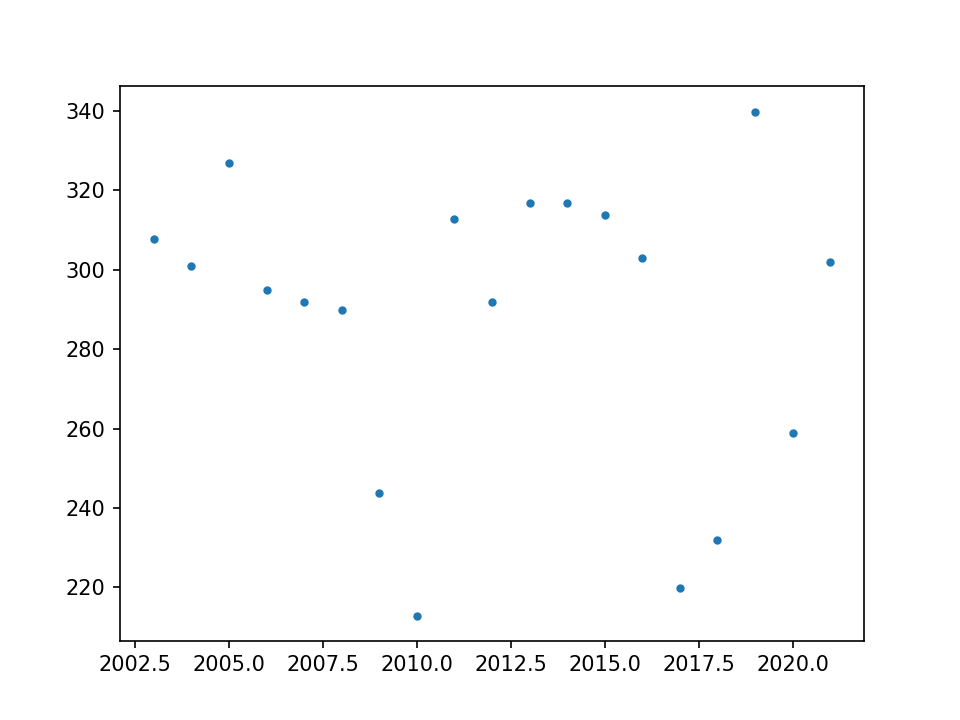

In [52]:
plt.figure()
plt.plot(dy,top_fires_doy[:,1,3,2],'.')

In [53]:
any(fi['FP'][c]['num'][:,ir]>0.0)

True

In [54]:
dy[4]

2007

<IPython.core.display.Javascript object>


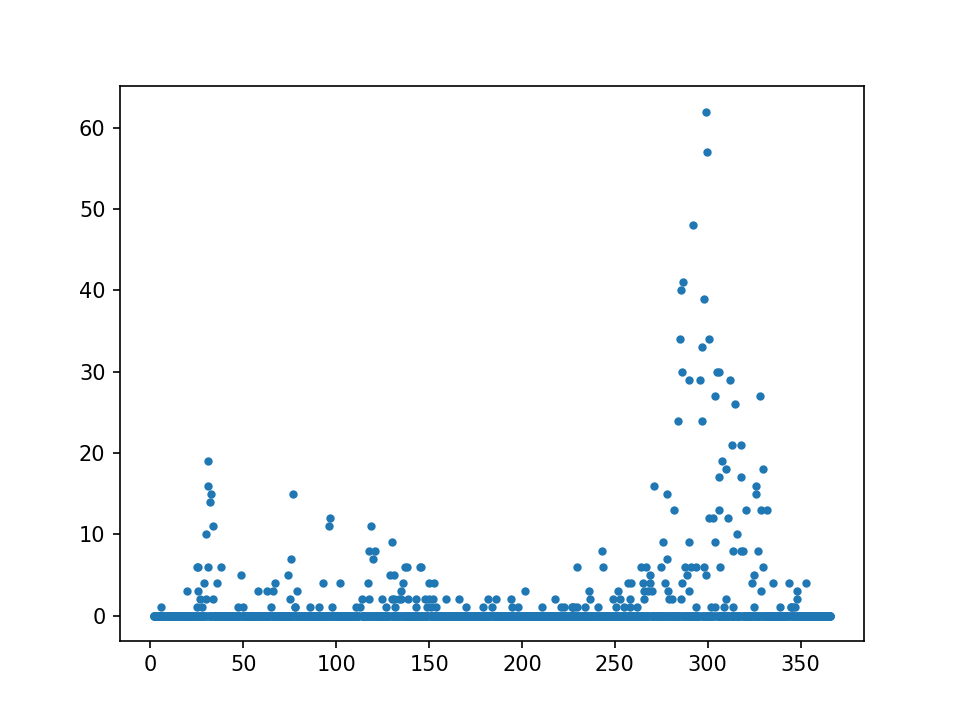

In [55]:
plt.figure()
plt.plot(fir[4]['doy'],fir[4]['FP']['coast']['num'][:,3],'.')

In [56]:
top_fires_doy

array([[[[317.88611111, 303.88333333, 307.87638889, ..., 318.84583333,
          213.84722222, 294.88472222],
         [303.88333333, 317.88611111, 213.84722222, ..., 310.88472222,
          294.88472222, 131.87638889],
         [303.88333333, 318.84583333, 131.87638889, ..., 130.91666667,
          311.84444444, 310.88472222],
         [303.88333333, 318.84583333, 131.87638889, ..., 130.91666667,
          311.84444444, 310.88472222]],

        [[300.84861111, 213.84722222, 233.84027778, ..., 227.87638889,
          309.84722222, 246.88472222],
         [241.87916667, 289.87916667, 316.84861111, ..., 248.88055556,
          311.84444444, 243.87638889],
         [317.88611111, 316.84861111, 303.88333333, ..., 294.88472222,
          215.84444444, 318.84583333],
         [303.88333333, 317.88611111, 307.87638889, ..., 294.88472222,
          215.84444444, 318.84583333]],

        [[226.83888889, 300.84861111, 231.84444444, ..., 232.88055556,
          238.84583333, 225.87916667],
      

In [57]:
from Sp_parameters import deriv, smooth
import warnings
warnings.simplefilter('ignore', RuntimeWarning)

<IPython.core.display.Javascript object>


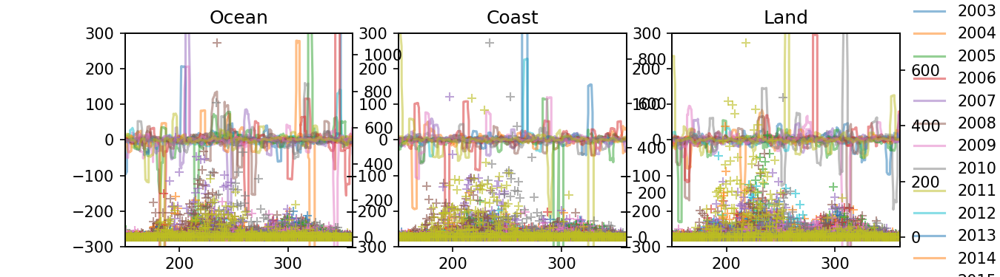

<IPython.core.display.Javascript object>


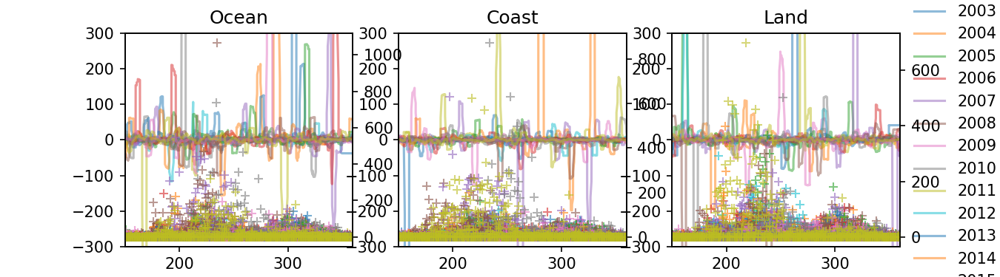

<IPython.core.display.Javascript object>


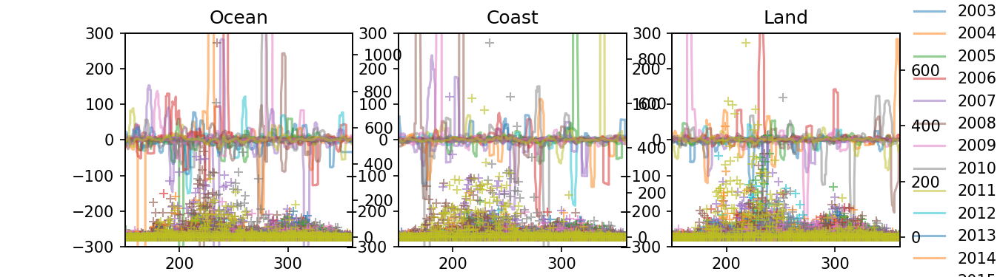

<IPython.core.display.Javascript object>


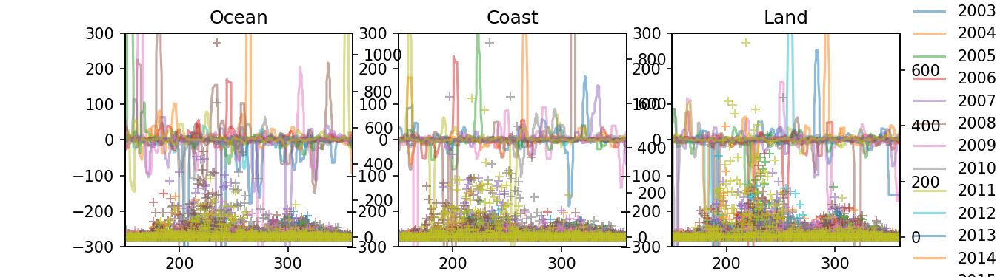

In [59]:
for j in range(4):

    fig, ax = plt.subplots(1,3,figsize=(9,2.5))
    axx = [axs.twinx() for axs in ax]
    for i,yy in enumerate(years):
        if cld[i]:
            doy = [t.timetuple().tm_yday+t.hour/24.0+t.minute/3600.0 for t in cld[i]['time']]

            p = ax[0].plot(doy,smooth(deriv(doy,cld[i]['CF']['ocean']['dev'][:,j]),15,old=True),'-',alpha=0.5,label=yy)
            #x,y = savgol_filter((doy,cld[i]['CF']['coast']['mean'][:,0]),25,3)
            #x,y = smooth_l(doy,cld[i]['CF']['coast']['mean'][:,0],1)
            #x,y = smooth_s(doy,cld[i]['CF']['coast']['mean'][:,0],w=125,p=3)
            #x,y = smooth_g(doy,cld[i]['CF']['ocean']['mean'][:,j],s=12.0)
            #ax[0].plot(x,y,'-',c=p[0].get_color(),label=yy)

            ax[1].plot(doy,smooth(deriv(doy,cld[i]['CF']['coast']['dev'][:,j]),15,old=True),'-',alpha=0.5,c=p[0].get_color(),label=yy)
            #x,y = smooth_g(doy,cld[i]['CF']['coast']['mean'][:,j],s=12.0)
            #ax[1].plot(x,y,'-',c=p[0].get_color(),label=yy)

            ax[2].plot(doy,smooth(deriv(doy,cld[i]['CF']['land']['dev'][:,j]),15,old=True),'-',alpha=0.5,c=p[0].get_color(),label=yy)
            #x,y = smooth_g(doy,cld[i]['CF']['land']['mean'][:,j],s=12.0)
            #ax[2].plot(x,y,'-',c=p[0].get_color(),label=yy)

            if fir[i]:
                doyf = [t.timetuple().tm_yday+t.hour/24.0+t.minute/3600.0 for t in fir[i]['time']]
                axx[0].plot(doyf,fir[i]['FP']['ocean']['num'][:,0],'+',alpha=0.6,c=p[0].get_color())
                axx[1].plot(doyf,fir[i]['FP']['coast']['num'][:,1],'+',alpha=0.6,c=p[0].get_color())
                axx[2].plot(doyf,fir[i]['FP']['land']['num'][:,2],'+',alpha=0.6,c=p[0].get_color())
                #x,y = smooth_g(doyf,fir[i]['FP']['ocean']['num'][:,j],s=12.0)
                #axx[0].plot(x,y,'+',c=p[0].get_color())
                #x,y = smooth_g(doyf,fir[i]['FP']['coast']['num'][:,j],s=12.0)
                #axx[1].plot(x,y,'+',c=p[0].get_color())
                #x,y = smooth_g(doyf,fir[i]['FP']['land']['num'][:,j],s=12.0)
                #axx[2].plot(x,y,'+',c=p[0].get_color())

    nul = [axs.set_ylim([-300,300]) for axs in ax]
    nul = [axs.set_xlim([150,360]) for axs in ax]
    ax[2].legend(frameon=False,bbox_to_anchor=(1.0,1.2) )
    ax[0].set_title('Ocean')
    ax[1].set_title('Coast')
    ax[2].set_title('Land')
    #plt.tight_layout()

# Build timeseries using pandas

In [60]:
cld[1]['lbls_rg']

{'ocean': ['SoCal', 'Central', 'NorCal', 'Oregon'],
 'coast': ['SoCal', 'Central', 'NorCal', 'Oregon'],
 'land': ['SoCal', 'Central Sierras', 'Northern Sierras', 'Oregon mountains'],
 'points': ['San Diego',
  'San Bernardino',
  'Los Padres',
  'Big Sur',
  'Sierra',
  'Santa Cruz',
  'Eldorado',
  'Mendocino',
  'Lassen-Shasta',
  'Klamath',
  'Rogue',
  'Mt Hood',
  'Portland',
  'Olympic',
  'Mt. Baker-Rainier']}

In [61]:
i = 17
j = 2

rg = 'coast'

fire_doy = []
cloud_doy = []
fire_time = []
cloud_time = []
cloud_cumdev = []
fir_counts = []

for i in range(1,19):
    doyc = [t.timetuple().tm_yday+t.hour/24.0+t.minute/3600.0 for t in cld[i]['time']]
    doys = [t.timetuple().tm_yday+t.hour/24.0+t.minute/3600.0 for t in fir[i]['time']]
    fire_doy = np.append(fire_doy,doys)
    cloud_doy = np.append(cloud_doy,doyc)
    fire_time = np.append(fire_time,fir[i]['time'])
    cloud_time = np.append(cloud_time,cld[i]['time'])
    cloud_cumdev = np.append(cloud_cumdev,cld[i]['CF'][rg]['dev'][:,j])
    fir_counts = np.append(fir_counts,fir[i]['FP'][rg]['num'][:,j])

In [62]:
i = 17
j = 2

rg = 'ocean'

cloud_doyoc = []
cloud_timeoc = []
cloud_cumdevoc = []

for i in range(1,19):
    doycoc = [t.timetuple().tm_yday+t.hour/24.0+t.minute/3600.0 for t in cld[i]['time']]
    cloud_doyoc = np.append(cloud_doy,doyc)
    cloud_timeoc = np.append(cloud_time,cld[i]['time'])
    cloud_cumdevoc = np.append(cloud_cumdev,cld[i]['CF'][rg]['dev'][:,j])

In [63]:
len(fire_doy),len(fir_counts),len(cloud_cumdev),len(cloud_doy)

(22015, 22015, 24312, 24312)

In [64]:
fire = pd.DataFrame(data=fir_counts)
fire['time'] = pd.to_datetime(fire_time)
fire['counts'] = fir_counts
fire.set_index('time', inplace = True)

In [65]:
del  fire[0]

In [66]:
cloud = pd.DataFrame(data=cloud_cumdev)
cloud['timecl'] = pd.to_datetime(cloud_time)
cloud['cumdev'] = cloud_cumdev
cloud.set_index('timecl', inplace = True)
del cloud[0]

In [67]:
cloudoc = pd.DataFrame(data=cloud_cumdevoc)
cloudoc['timeoc'] = pd.to_datetime(cloud_timeoc)
cloudoc['cumdevoc'] = cloud_cumdevoc
cloudoc.set_index('timeoc', inplace = True)
del cloudoc[0]

In [68]:
df = pd.concat([cloud, cloudoc, fire]).sort_index().interpolate()
df = df.reindex(df.index)

In [69]:
df

,cumdev,cumdevoc,counts
2004-01-01 19:05:06.733100,2.013488e-01,NaN,NaN
2004-01-01 19:05:06.733100,3.024835e-01,2.013488e-01,NaN
2004-01-01 19:10:06.592625,4.036182e-01,3.024835e-01,NaN
2004-01-01 19:10:06.592625,4.716517e-01,4.036182e-01,NaN
2004-01-01 20:40:00.000000,5.396853e-01,4.716517e-01,0.0
...,...,...,...
2021-12-31 19:15:11.008708,1.104688e-01,1.665335e-14,0.0
2021-12-31 19:15:11.008708,5.523439e-02,9.409140e-14,0.0
2021-12-31 19:15:11.008708,9.409140e-14,9.409140e-14,0.0
2021-12-31 20:55:00.000000,9.409140e-14,9.409140e-14,0.0


In [70]:
df.dropna(inplace=True)
dfd = df.resample('D').mean()
dfd.interpolate(inplace=True)

<IPython.core.display.Javascript object>


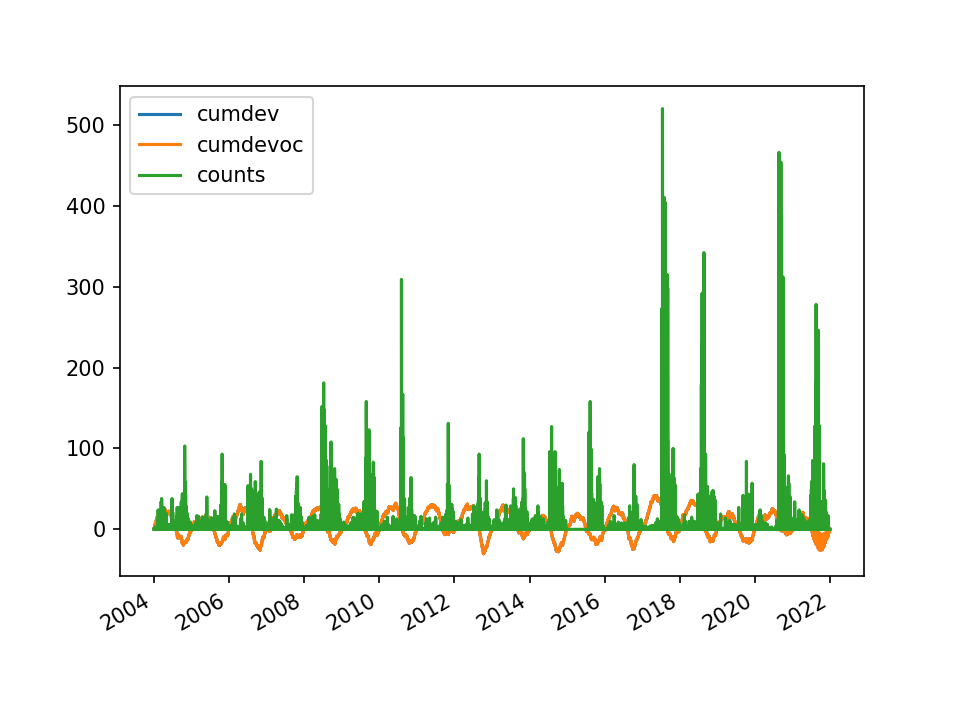

<AxesSubplot:>

In [71]:
df.plot()

In [72]:
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

<IPython.core.display.Javascript object>


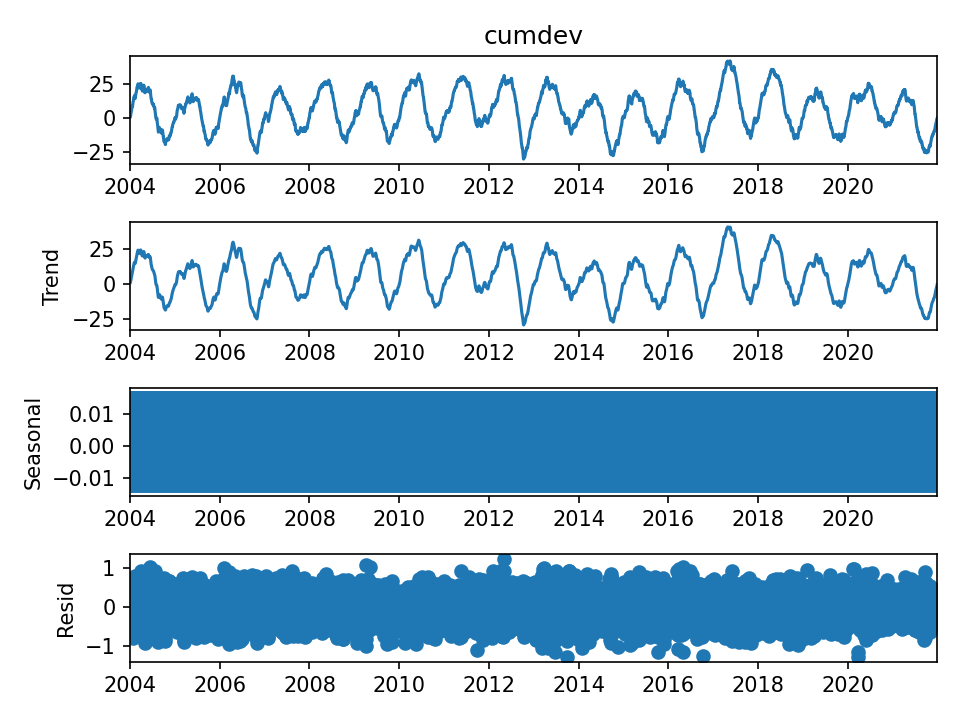

<IPython.core.display.Javascript object>


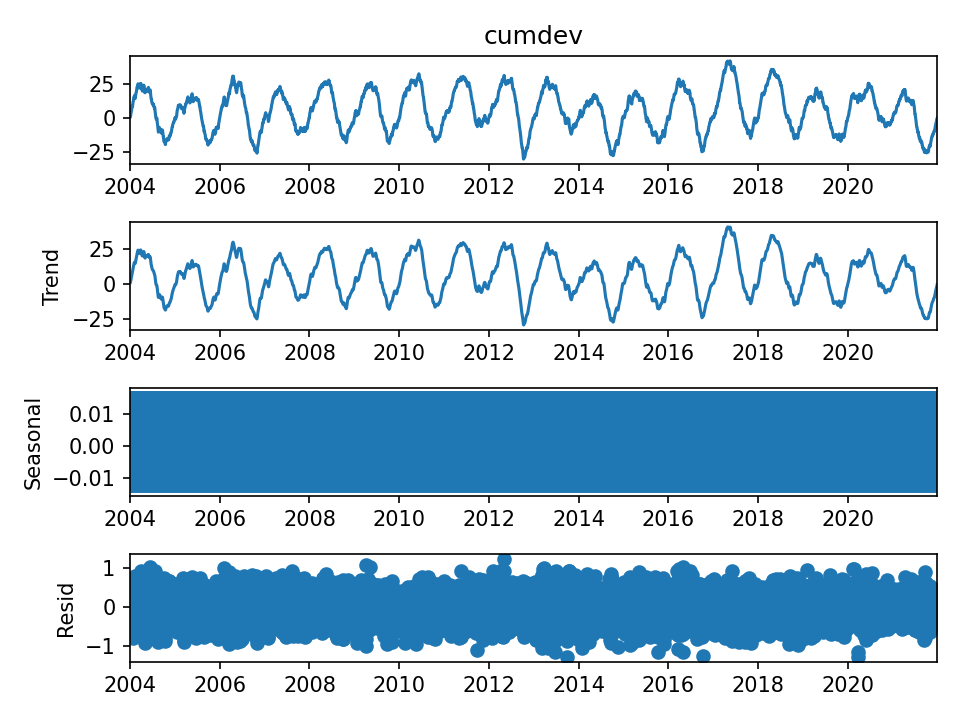

In [73]:
result_cloud = seasonal_decompose(dfd['cumdev'])
result_cloud.plot()

<IPython.core.display.Javascript object>


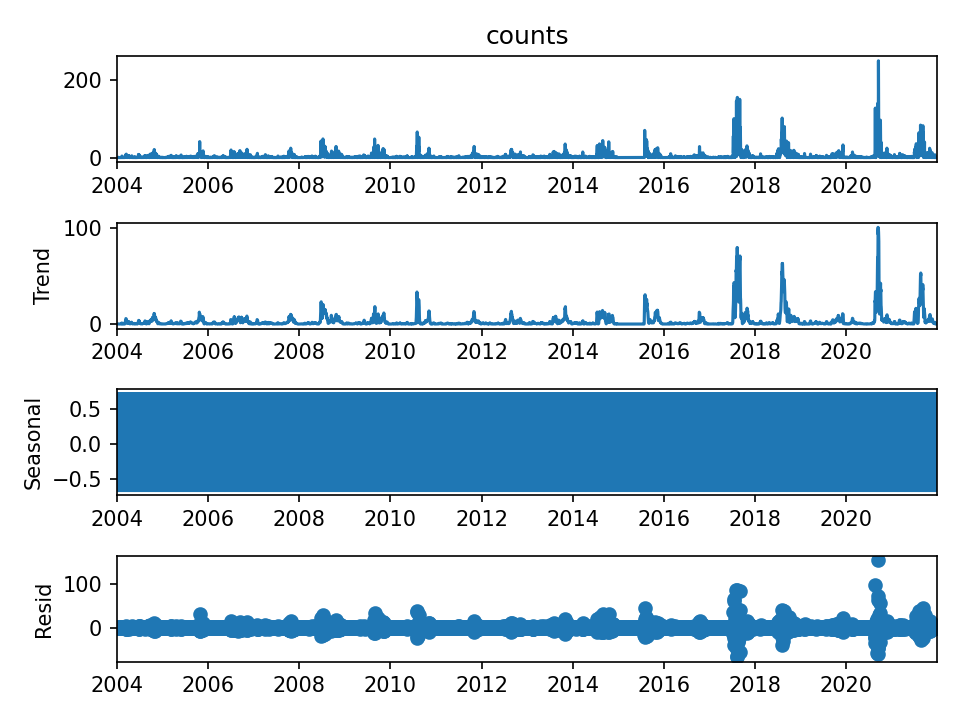

<IPython.core.display.Javascript object>


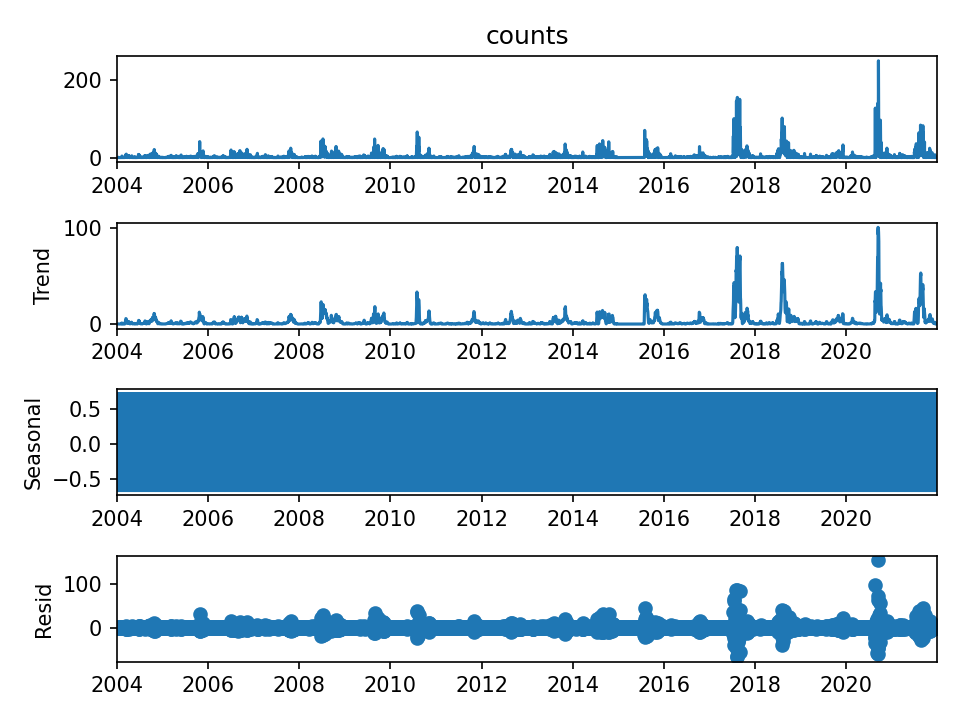

In [74]:
result_fire = seasonal_decompose(dfd['counts'])
result_fire.plot()

<IPython.core.display.Javascript object>


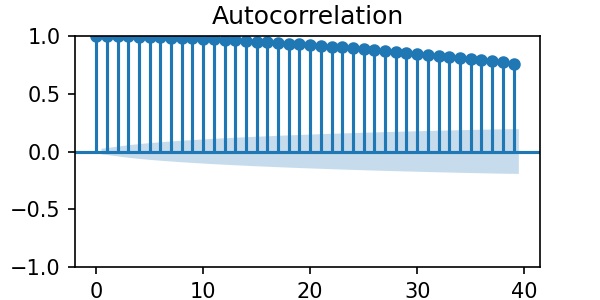

In [75]:
fig, ax = plt.subplots(figsize = (4,2))

plot_acf(dfd['cumdev'], ax = ax)

plt.show()

<IPython.core.display.Javascript object>


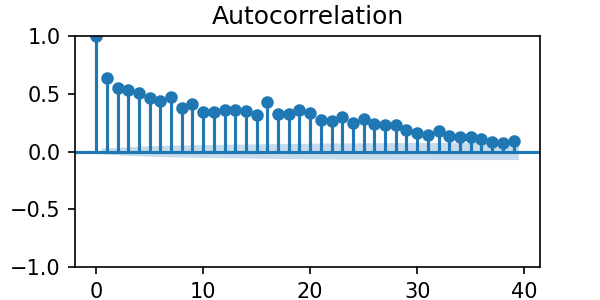

In [76]:
fig, ax = plt.subplots(figsize = (4,2))

plot_acf(dfd['counts'], ax = ax)

plt.show()

## Use DARTS

In [77]:
from darts import TimeSeries
import darts.models as dmo
import darts.metrics as dme

Importing plotly failed. Interactive plots will not work.


In [78]:
def plot_backtest(series, forecast, model_name,idx=-144):
    series[idx:].plot(label='Actual Values')
    forecast[idx:].plot(label= 'Forecast')
    plt.title(model_name)
    plt.show()
    
def print_metrics(series, forecast, model_name):
    mae_ = dme.mae(series, forecast)
    rmse_ = dme.rmse(series, forecast)
    try:
        mape_ = dme.mape(series, forecast)
        smape_ = dme.smape(series, forecast)
    except ValueError:
        mape_ = np.nan
        smape_ = np.nan
        
    r2_score_ = dme.r2_score(series, forecast)
    
    dict_ = {'MAE': mae_, 'RMSE': rmse_,
             'MAPE': mape_, 'SMAPE': smape_, 
             'R2': r2_score_}
    
    df = pd.DataFrame(dict_, index = [model_name])
    
    return(df.round(decimals = 2))  

In [79]:
dfd.keys()

Index(['cumdev', 'cumdevoc', 'counts'], dtype='object')

In [80]:
firs = pd.DataFrame(dfd['counts'])
clds = pd.DataFrame(dfd['cumdev'])
cldo = pd.DataFrame(dfd['cumdevoc'])

In [81]:
series_fire = TimeSeries.from_dataframe(firs)
series_cld = TimeSeries.from_dataframe(clds)
series_cldoc = TimeSeries.from_dataframe(cldo)

start = pd.Timestamp('010103')
df_metrics = pd.DataFrame()

In [82]:
series_cld_tr,_ = series_cld.split_before(0.75)
series_cldoc_tr,_ = series_cldoc.split_before(0.75)

In [83]:
series_train,_ = series_fire.split_before(0.75)
nfore = len(_)
ntrain = len(series_train)

In [84]:
def eval_model(model, past_covariates=None, future_covariates=None,nfore=1645):
    # Past and future covariates are optional because they won't always be used in our tests
    
    # We backtest the model on the last 20% of the flow series, with a horizon of 10 steps:
    backtest = model.historical_forecasts(series=series_fire, 
                                          past_covariates=past_covariates,
                                          future_covariates=future_covariates,
                                          start=0.75, 
                                          retrain=False,
                                          verbose=True, 
                                          forecast_horizon=nfore)
    
    series_fire[-len(backtest)-100:].plot()
    backtest.plot(label='backtest (n={:3.0f})'.format(nfore))
    
    met = print_metrics(series_fire,backtest,model.model_params['model'])
    return met

### No covariate

In [240]:
import logging

In [283]:
brnn_no_cov = dmo.BlockRNNModel(input_chunk_length=30, 
                            output_chunk_length=10, 
                            n_rnn_layers=2,batch_size=64)

In [284]:
brnn_no_cov.fit(series_train, 
                epochs=25, 
                verbose=True)


[2022-03-25 17:48:33,782] INFO | darts.models.forecasting.torch_forecasting_model | Train dataset contains 4891 samples.
[2022-03-25 17:48:33,782] INFO | darts.models.forecasting.torch_forecasting_model | Train dataset contains 4891 samples.
[2022-03-25 17:48:33,789] INFO | darts.models.forecasting.torch_forecasting_model | Time series values are 64-bits; casting model to float64.
[2022-03-25 17:48:33,789] INFO | darts.models.forecasting.torch_forecasting_model | Time series values are 64-bits; casting model to float64.
[2022-03-25 17:48:33,791] WARNING | darts.models.forecasting.torch_forecasting_model | DeprecationWarning: kwarg `verbose` is deprecated and will be removed in a future Darts version. Instead, control verbosity with PyTorch Lightning Trainer parameters `enable_progress_bar`, `progress_bar_refresh_rate` and `enable_model_summary` in the `pl_trainer_kwargs` dict at model creation.
[2022-03-25 17:48:33,791] WARNING | darts.models.forecasting.torch_forecasting_model | Depre

Training: 0it [00:00, ?it/s]

In [285]:
backtest = brnn_no_cov.historical_forecasts(series=series_fire, retrain=False,
                                          verbose=True,                                             
                                          forecast_horizon=300,start=0.75)

  0%|          | 0/1346 [00:00<?, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

Predicting: 77it [00:00, ?it/s]

<IPython.core.display.Javascript object>


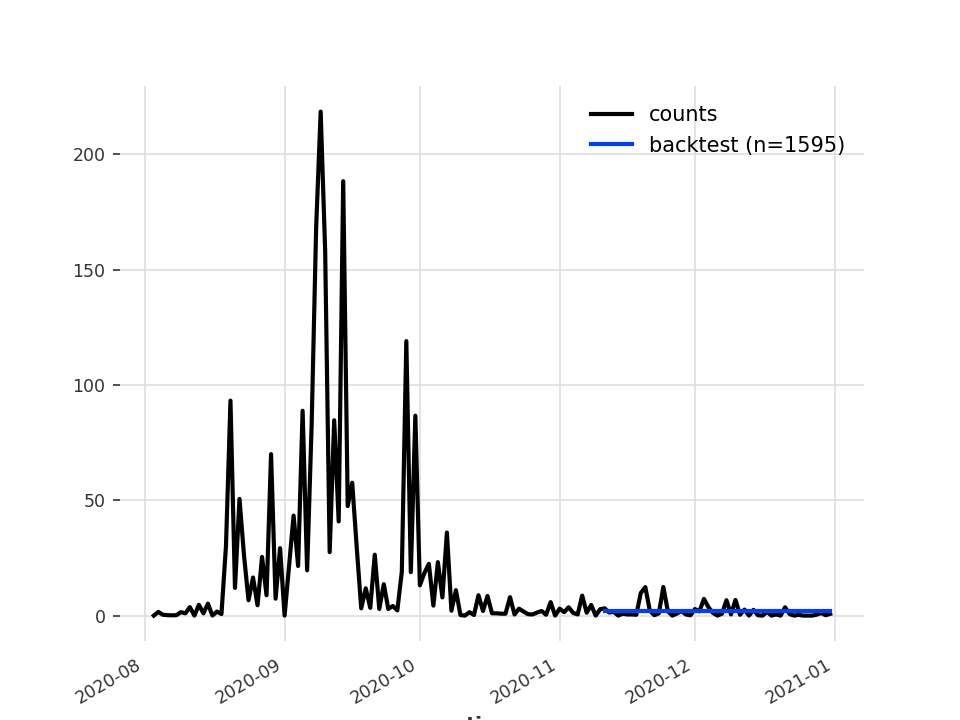

  0%|          | 0/51 [00:00<?, ?it/s]

Predicting: 6it [00:00, ?it/s]

Predicting: 6it [00:00, ?it/s]

Predicting: 6it [00:00, ?it/s]

Predicting: 6it [00:00, ?it/s]

Predicting: 6it [00:00, ?it/s]

Predicting: 6it [00:00, ?it/s]

Predicting: 6it [00:00, ?it/s]

Predicting: 6it [00:00, ?it/s]

Predicting: 6it [00:00, ?it/s]

Predicting: 6it [00:00, ?it/s]

Predicting: 6it [00:00, ?it/s]

Predicting: 6it [00:00, ?it/s]

Predicting: 6it [00:00, ?it/s]

Predicting: 6it [00:00, ?it/s]

Predicting: 6it [00:00, ?it/s]

Predicting: 6it [00:00, ?it/s]

Predicting: 6it [00:00, ?it/s]

Predicting: 6it [00:00, ?it/s]

Predicting: 6it [00:00, ?it/s]

Predicting: 6it [00:00, ?it/s]

Predicting: 6it [00:00, ?it/s]

Predicting: 6it [00:00, ?it/s]

Predicting: 6it [00:00, ?it/s]

Predicting: 6it [00:00, ?it/s]

Predicting: 6it [00:00, ?it/s]

Predicting: 6it [00:00, ?it/s]

Predicting: 6it [00:00, ?it/s]

Predicting: 6it [00:00, ?it/s]

Predicting: 6it [00:00, ?it/s]

Predicting: 6it [00:00, ?it/s]

Predicting: 6it [00:00, ?it/s]

Predicting: 6it [00:00, ?it/s]

Predicting: 6it [00:00, ?it/s]

Predicting: 6it [00:00, ?it/s]

Predicting: 6it [00:00, ?it/s]

Predicting: 6it [00:00, ?it/s]

Predicting: 6it [00:00, ?it/s]

Predicting: 6it [00:00, ?it/s]

Predicting: 6it [00:00, ?it/s]

Predicting: 6it [00:00, ?it/s]

Predicting: 6it [00:00, ?it/s]

Predicting: 6it [00:00, ?it/s]

Predicting: 6it [00:00, ?it/s]

Predicting: 6it [00:00, ?it/s]

Predicting: 6it [00:00, ?it/s]

Predicting: 6it [00:00, ?it/s]

Predicting: 6it [00:00, ?it/s]

Predicting: 6it [00:00, ?it/s]

Predicting: 6it [00:00, ?it/s]

Predicting: 6it [00:00, ?it/s]

Predicting: 6it [00:00, ?it/s]

[2022-03-25 14:58:12,888] ERROR | darts.metrics.metrics | ValueError: The actual series must be strictly positive to compute the MAPE.


In [255]:
plt.figure()
eval_model(brnn_no_cov,nfore=nfore-50)

<IPython.core.display.Javascript object>


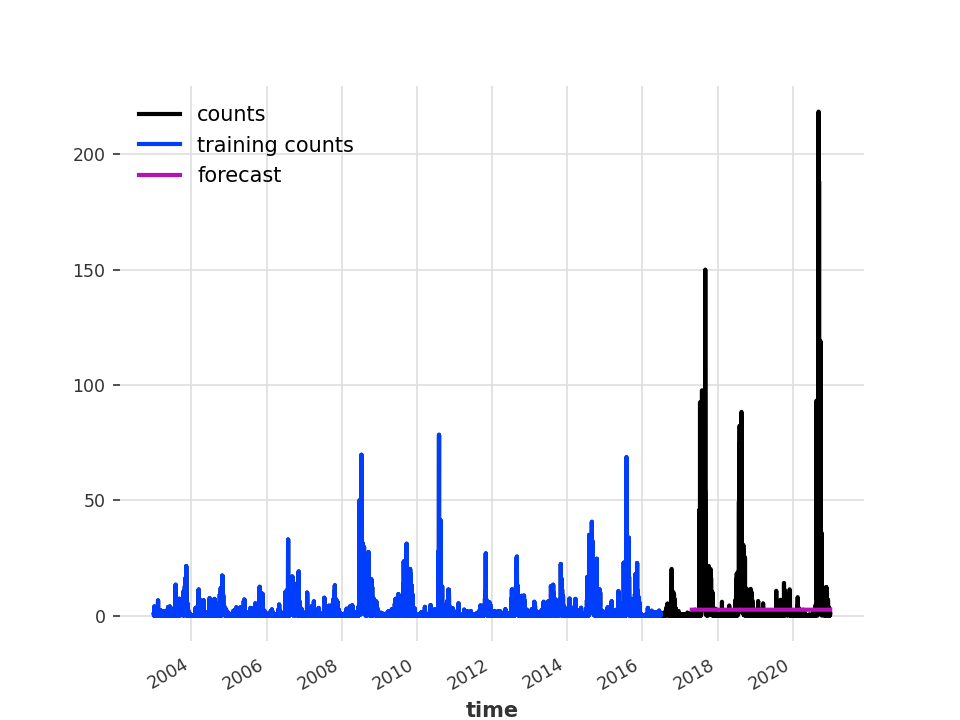

In [287]:
plt.figure()
series_fire.plot()
series_train.plot(label='training counts')
backtest.plot(label='forecast')

### Add covariate

In [85]:
brnn_wi_cov = dmo.BlockRNNModel(input_chunk_length=30, 
                             output_chunk_length=10, 
                             n_rnn_layers=2)

In [86]:
brnn_wi_cov.fit(series_train, 
                 past_covariates=series_cld_tr.stack(series_cldoc_tr), 
                 epochs=50, 
                 verbose=True)

[2022-09-22 11:55:54,551] INFO | darts.models.forecasting.torch_forecasting_model | Train dataset contains 4891 samples.
[2022-09-22 11:55:54,551] INFO | darts.models.forecasting.torch_forecasting_model | Train dataset contains 4891 samples.
[2022-09-22 11:55:54,829] INFO | darts.models.forecasting.torch_forecasting_model | Time series values are 64-bits; casting model to float64.
[2022-09-22 11:55:54,829] INFO | darts.models.forecasting.torch_forecasting_model | Time series values are 64-bits; casting model to float64.
[2022-09-22 11:55:54,831] WARNING | darts.models.forecasting.torch_forecasting_model | DeprecationWarning: kwarg `verbose` is deprecated and will be removed in a future Darts version. Instead, control verbosity with PyTorch Lightning Trainer parameters `enable_progress_bar`, `progress_bar_refresh_rate` and `enable_model_summary` in the `pl_trainer_kwargs` dict at model creation.
[2022-09-22 11:55:54,831] WARNING | darts.models.forecasting.torch_forecasting_model | Depre

Training: 0it [00:00, ?it/s]

In [87]:
backtest_wi = brnn_wi_cov.historical_forecasts(series=series_fire, retrain=False,
                                          verbose=True, past_covariates=series_cld.stack(series_cldoc),                                     
                                          forecast_horizon=10,start=0.75)

  0%|          | 0/1636 [00:00<?, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

<IPython.core.display.Javascript object>


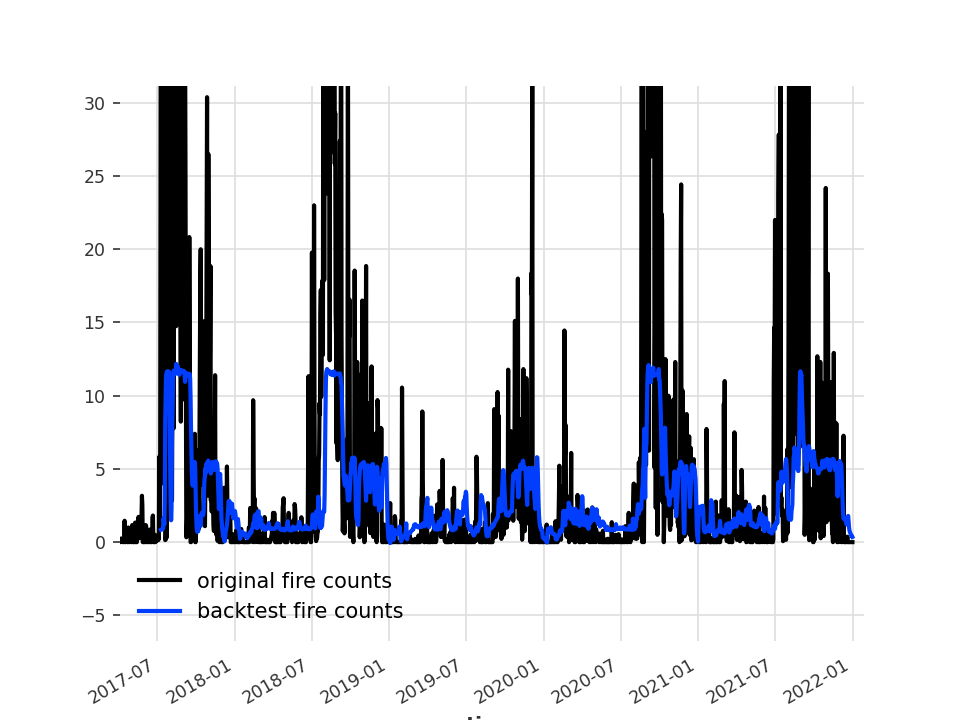

In [88]:
plt.figure()

series_fire.plot(label='original fire counts')
backtest_wi.plot(label='backtest fire counts')

In [89]:
def get_start_fire(series_fire,threshold_val=5,month_start=6):
    years = series_fire.time_index.year.unique()
    fir_start = []
    for y in years:
        mean_start = np.mean(series_fire.values()[(series_fire.time_index.year==y) & (series_fire.time_index.month<=month_start)])
        
        ij = (series_fire.time_index.year==y) & (series_fire.values() > mean_start*1.4)[:,0] & (series_fire.time_index.month>=month_start)
        if any(ij):
            fir_start.append(series_fire.get_timestamp_at_point(np.where(ij)[0][0]))
        else:
            fir_start.append(0)
    return fir_start

In [90]:
fir_start = get_start_fire(series_fire)

In [91]:
fir_start_for = get_start_fire(backtest_wi)

In [92]:
fir_start

[Timestamp('2004-06-20 00:00:00', freq='D'),
 Timestamp('2005-06-16 00:00:00', freq='D'),
 Timestamp('2006-06-20 00:00:00', freq='D'),
 Timestamp('2007-06-01 00:00:00', freq='D'),
 Timestamp('2008-06-13 00:00:00', freq='D'),
 Timestamp('2009-06-01 00:00:00', freq='D'),
 Timestamp('2010-06-20 00:00:00', freq='D'),
 Timestamp('2011-06-09 00:00:00', freq='D'),
 Timestamp('2012-06-04 00:00:00', freq='D'),
 Timestamp('2013-06-04 00:00:00', freq='D'),
 Timestamp('2014-06-02 00:00:00', freq='D'),
 Timestamp('2015-07-29 00:00:00', freq='D'),
 Timestamp('2016-06-01 00:00:00', freq='D'),
 Timestamp('2017-06-04 00:00:00', freq='D'),
 Timestamp('2018-06-07 00:00:00', freq='D'),
 Timestamp('2019-06-01 00:00:00', freq='D'),
 Timestamp('2020-06-10 00:00:00', freq='D'),
 Timestamp('2021-06-05 00:00:00', freq='D')]

In [93]:
fir_start_for

[0,
 Timestamp('2018-06-02 00:00:00', freq='D'),
 Timestamp('2019-06-09 00:00:00', freq='D'),
 Timestamp('2020-08-09 00:00:00', freq='D'),
 Timestamp('2021-06-02 00:00:00', freq='D')]

In [94]:
backtest_wi.values()[backtest_wi.values()<0] = 0.0

In [95]:
print_metrics(series_fire,backtest_wi,brnn_wi_cov.model_params['model'])

[2022-09-22 12:03:29,368] ERROR | darts.metrics.metrics | ValueError: The actual series must be strictly positive to compute the MAPE.


,MAE,RMSE,MAPE,SMAPE,R2
RNN,5.7,16.18,NaN,NaN,0.11


### covariates with TCN model

In [96]:
tcn_wi_cov = dmo.TCNModel(input_chunk_length=30, 
                             output_chunk_length=10)

In [97]:
tcn_wi_cov.fit(series_train, 
                 past_covariates=series_cld_tr.stack(series_cldoc_tr), 
                 epochs=100, 
                 verbose=True)

[2022-09-22 12:03:35,765] INFO | darts.models.forecasting.torch_forecasting_model | Train dataset contains 4891 samples.
[2022-09-22 12:03:35,765] INFO | darts.models.forecasting.torch_forecasting_model | Train dataset contains 4891 samples.
[2022-09-22 12:03:35,770] INFO | darts.models.forecasting.tcn_model | Number of layers chosen: 4
[2022-09-22 12:03:35,770] INFO | darts.models.forecasting.tcn_model | Number of layers chosen: 4
[2022-09-22 12:03:35,774] INFO | darts.models.forecasting.torch_forecasting_model | Time series values are 64-bits; casting model to float64.
[2022-09-22 12:03:35,774] INFO | darts.models.forecasting.torch_forecasting_model | Time series values are 64-bits; casting model to float64.
[2022-09-22 12:03:35,775] WARNING | darts.models.forecasting.torch_forecasting_model | DeprecationWarning: kwarg `verbose` is deprecated and will be removed in a future Darts version. Instead, control verbosity with PyTorch Lightning Trainer parameters `enable_progress_bar`, `pro

Training: 0it [00:00, ?it/s]

In [98]:
backtest_wi_tcn = tcn_wi_cov.historical_forecasts(series=series_fire, retrain=False,
                                          verbose=True, past_covariates=series_cld.stack(series_cldoc),                                     
                                          forecast_horizon=10,start=0.75)

  0%|          | 0/1636 [00:00<?, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

<IPython.core.display.Javascript object>


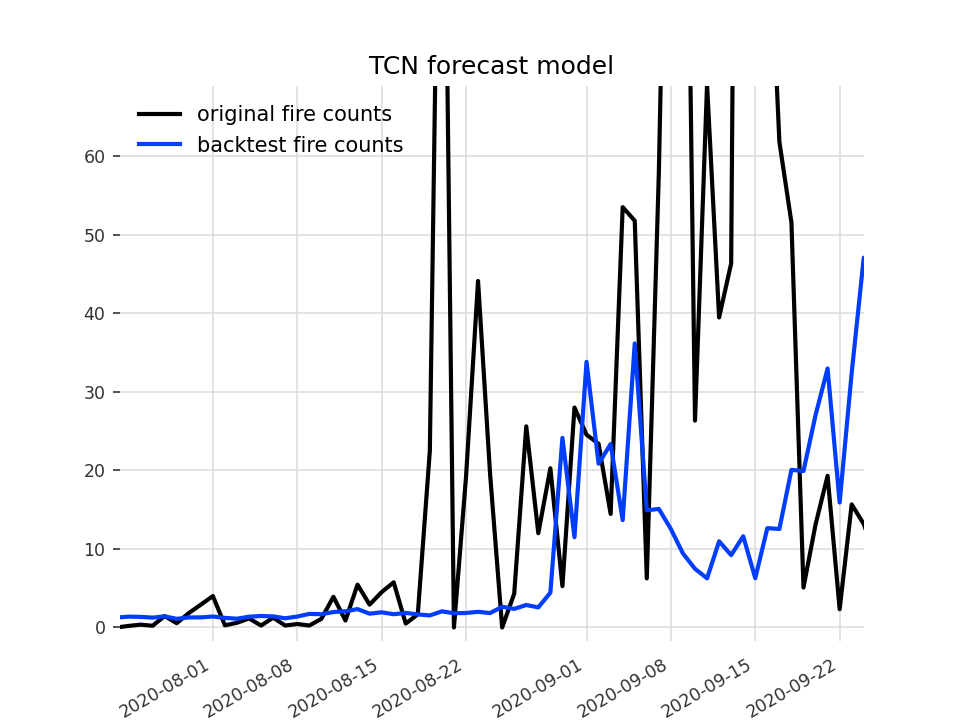

Text(0.5, 1.0, 'TCN forecast model')

In [100]:
plt.figure()

series_fire.plot(label='original fire counts')
backtest_wi_tcn.plot(label='backtest fire counts')
plt.title('TCN forecast model')

In [101]:
series_fire['counts'].values()

array([[0.],
       [0.],
       [0.],
       ...,
       [0.],
       [0.],
       [0.]])

<IPython.core.display.Javascript object>


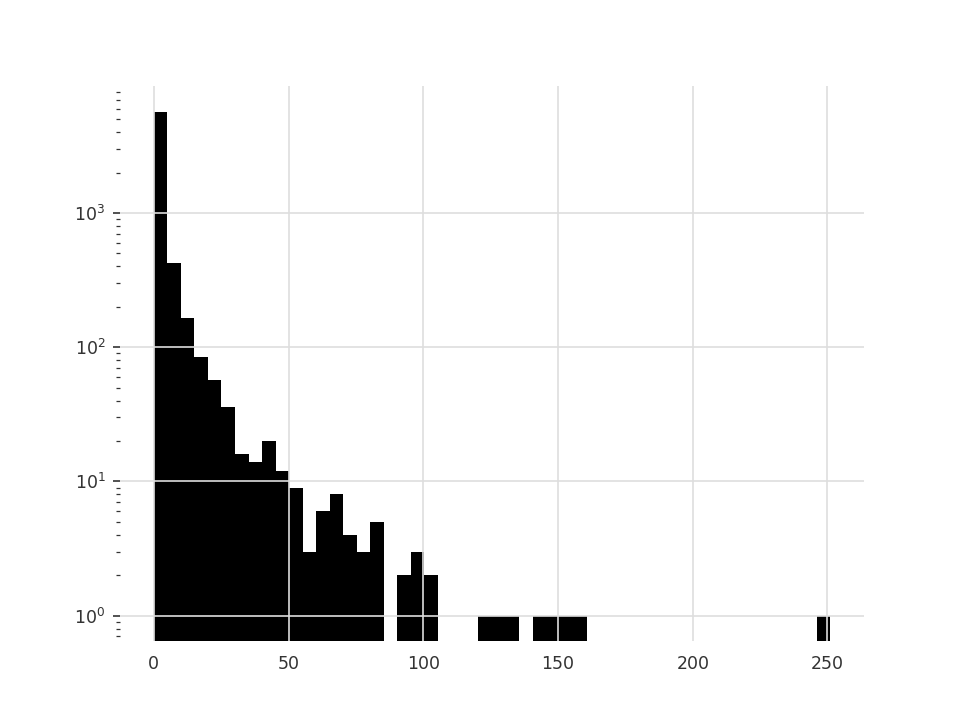

In [102]:
plt.figure()
plt.hist(series_fire['counts'].values(),bins=50)
plt.yscale('log')

In [103]:
fir_start_fortcn = get_start_fire(backtest_wi_tcn)

In [104]:
fir_start_fortcn

[0,
 Timestamp('2018-06-03 00:00:00', freq='D'),
 Timestamp('2019-06-14 00:00:00', freq='D'),
 Timestamp('2020-08-09 00:00:00', freq='D'),
 Timestamp('2021-07-08 00:00:00', freq='D')]

In [105]:
fir_start

[Timestamp('2004-06-20 00:00:00', freq='D'),
 Timestamp('2005-06-16 00:00:00', freq='D'),
 Timestamp('2006-06-20 00:00:00', freq='D'),
 Timestamp('2007-06-01 00:00:00', freq='D'),
 Timestamp('2008-06-13 00:00:00', freq='D'),
 Timestamp('2009-06-01 00:00:00', freq='D'),
 Timestamp('2010-06-20 00:00:00', freq='D'),
 Timestamp('2011-06-09 00:00:00', freq='D'),
 Timestamp('2012-06-04 00:00:00', freq='D'),
 Timestamp('2013-06-04 00:00:00', freq='D'),
 Timestamp('2014-06-02 00:00:00', freq='D'),
 Timestamp('2015-07-29 00:00:00', freq='D'),
 Timestamp('2016-06-01 00:00:00', freq='D'),
 Timestamp('2017-06-04 00:00:00', freq='D'),
 Timestamp('2018-06-07 00:00:00', freq='D'),
 Timestamp('2019-06-01 00:00:00', freq='D'),
 Timestamp('2020-06-10 00:00:00', freq='D'),
 Timestamp('2021-06-05 00:00:00', freq='D')]

In [106]:
print_metrics(series_fire,backtest_wi_tcn,'TCN')

[2022-09-22 12:16:22,604] ERROR | darts.metrics.metrics | ValueError: The actual series must be strictly positive to compute the MAPE.


,MAE,RMSE,MAPE,SMAPE,R2
TCN,5.62,15.83,NaN,NaN,0.15


## Build binary time series of fire events

In [107]:
month_start=6
mean_start = np.max(series_fire.values()[series_fire.time_index.month<=month_start])
num_bins,bins_rg = np.histogram(series_fire.values(),bins=200)
ij = (series_fire.values() > bins_rg[2])[:,0] & (series_fire.time_index.month>=month_start)

In [108]:
num_bins,bins_rg = np.histogram(series_fire.values(),bins=200)

In [109]:
bins_rg[2]

2.51

In [110]:
mean_start

42.75000000000001

<IPython.core.display.Javascript object>


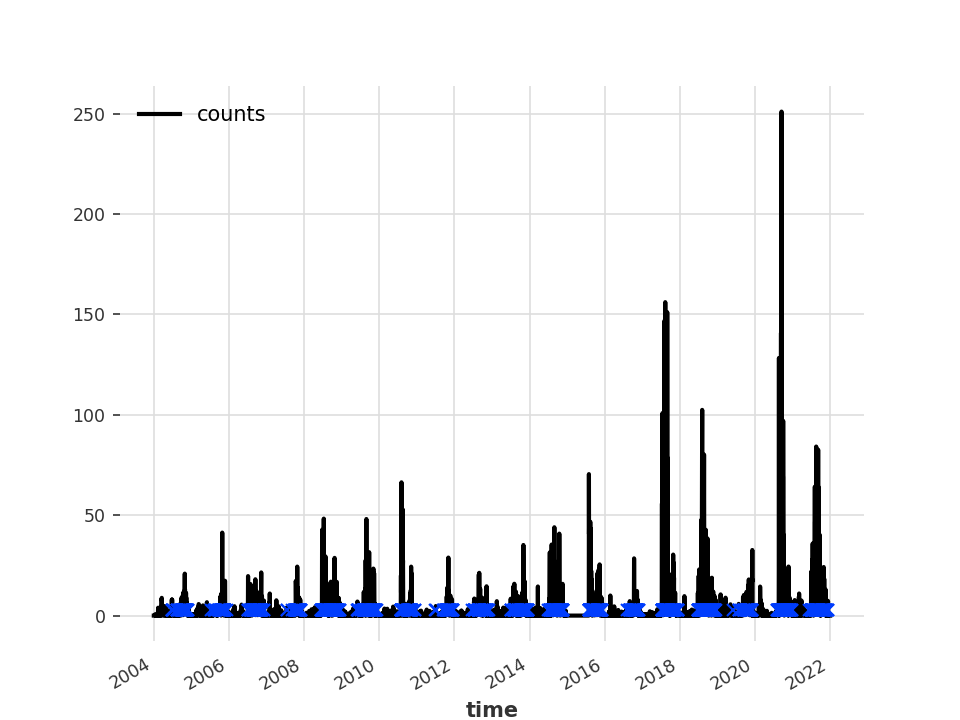

In [111]:
plt.figure()
series_fire.plot()
#series_fire['counts'][ij].plot()
plt.plot(series_fire.time_index[ij],np.where(ij)[0]*0+3.0,'x')

In [112]:
bools = series_fire.values()
bools[ij,0] = 1.0
bools[~ij,0] = 0.0

In [113]:
bools_df = pd.DataFrame(data=bools)
bools_df['time'] = series_fire.time_index
bools_df['isfire'] = bools
bools_df.set_index('time', inplace = True)
del bools_df[0]

In [114]:
sfb = TimeSeries.from_dataframe(bools_df)

In [115]:
sfb.components

Index(['isfire'], dtype='object', name='component')

In [116]:
series_fire_bool.stack(sfb)

NameError: name 'series_fire_bool' is not defined

<IPython.core.display.Javascript object>


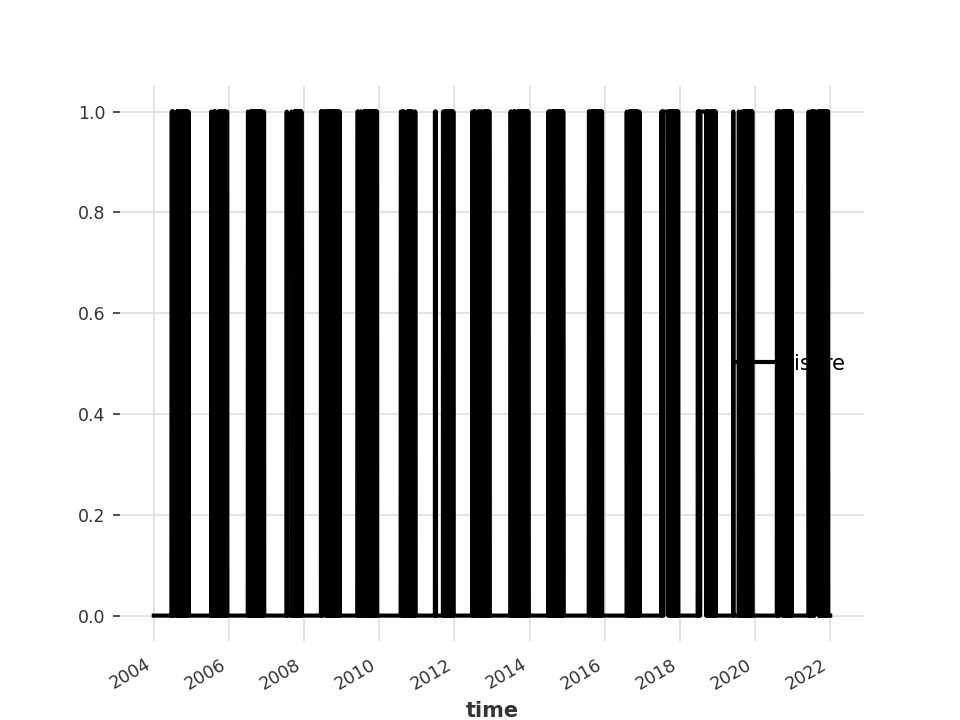

In [117]:
plt.figure()
sfb.plot()

#### Train binary model

In [118]:
series_train_bool,_ = sfb.split_before(0.75)
nfore = len(_)
ntrain = len(series_train_bool)

In [119]:
tcn_wi_cov2 = dmo.TCNModel(input_chunk_length=40, 
                             output_chunk_length=20)

In [120]:
tcn_wi_cov2.fit(series_train_bool, 
                 past_covariates=series_cld_tr.stack(series_cldoc_tr), 
                 epochs=50, 
                 verbose=True)

[2022-09-22 12:18:12,624] INFO | darts.models.forecasting.torch_forecasting_model | Train dataset contains 4871 samples.
[2022-09-22 12:18:12,624] INFO | darts.models.forecasting.torch_forecasting_model | Train dataset contains 4871 samples.
[2022-09-22 12:18:12,628] INFO | darts.models.forecasting.tcn_model | Number of layers chosen: 4
[2022-09-22 12:18:12,628] INFO | darts.models.forecasting.tcn_model | Number of layers chosen: 4
[2022-09-22 12:18:12,633] INFO | darts.models.forecasting.torch_forecasting_model | Time series values are 64-bits; casting model to float64.
[2022-09-22 12:18:12,633] INFO | darts.models.forecasting.torch_forecasting_model | Time series values are 64-bits; casting model to float64.
[2022-09-22 12:18:12,634] WARNING | darts.models.forecasting.torch_forecasting_model | DeprecationWarning: kwarg `verbose` is deprecated and will be removed in a future Darts version. Instead, control verbosity with PyTorch Lightning Trainer parameters `enable_progress_bar`, `pro

Training: 0it [00:00, ?it/s]

In [121]:
backtest_wi_tcn2 = tcn_wi_cov2.historical_forecasts(series=sfb, retrain=False,
                                          verbose=True, past_covariates=series_cld.stack(series_cldoc),                                     
                                          forecast_horizon=20,start=0.5)

  0%|          | 0/3269 [00:00<?, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

Predicting: 153it [00:00, ?it/s]

<IPython.core.display.Javascript object>


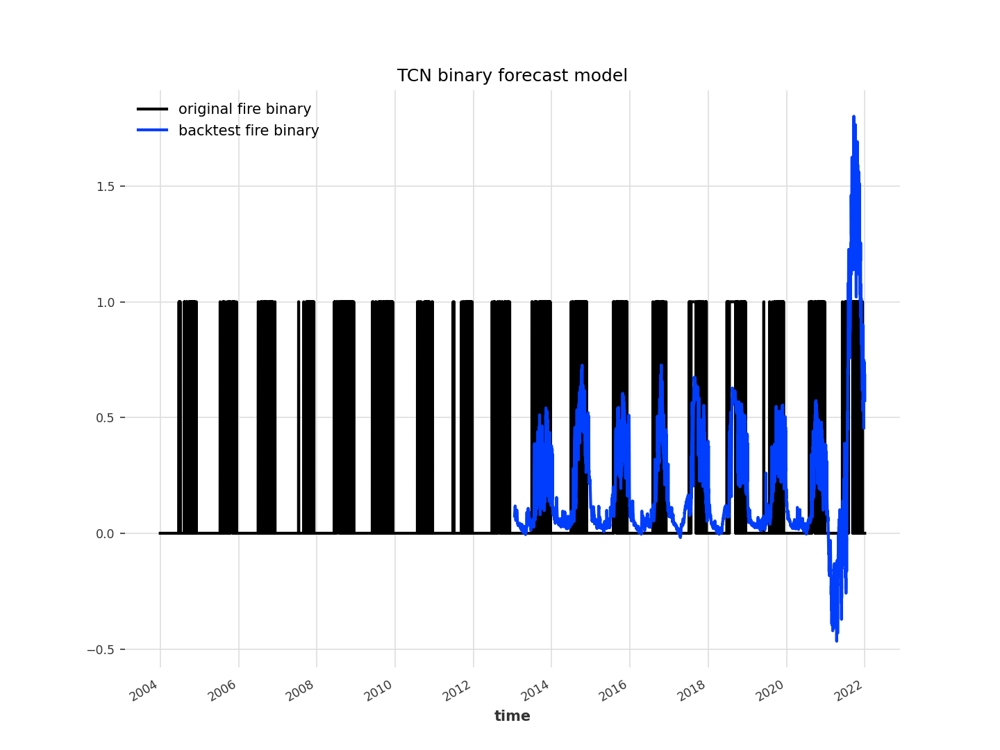

Text(0.5, 1.0, 'TCN binary forecast model')

In [122]:
plt.figure()

sfb.plot(label='original fire binary')
backtest_wi_tcn2.plot(label='backtest fire binary')
plt.title('TCN binary forecast model')

In [702]:
rf_wi_cov = dmo.RandomForest(lags=60,lags_past_covariates=20)

In [705]:
rf_wi_cov.fit(series_train_bool, 
                 past_covariates=series_cld_tr.stack(series_cldoc_tr))

In [706]:
backtest_wi_rf = rf_wi_cov.historical_forecasts(series=sfb, retrain=False,
                                          verbose=True, past_covariates=series_cld.stack(series_cldoc),                                     
                                          forecast_horizon=20,start=0.5)

  0%|          | 0/3269 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


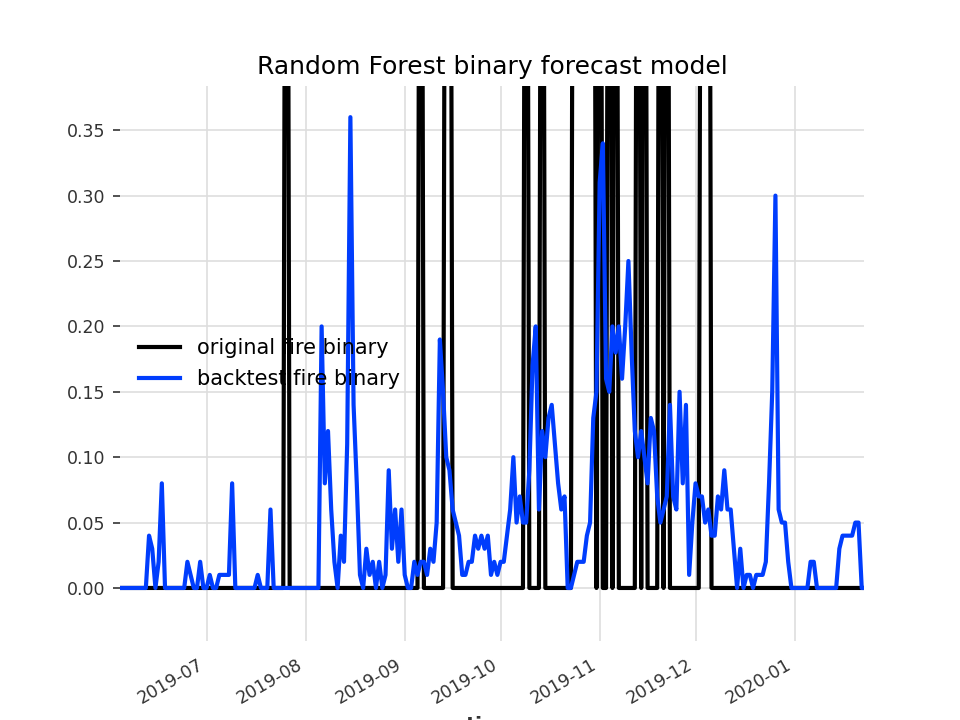

Text(0.5, 1.0, 'Random Forest binary forecast model')

In [708]:
plt.figure()

sfb.plot(label='original fire binary')
backtest_wi_rf.plot(label='backtest fire binary')
plt.title('Random Forest binary forecast model')

In [709]:
print_metrics(sfb,backtest_wi_rf,'Random Forest')

[2022-04-04 16:42:12,246] ERROR | darts.metrics.metrics | ValueError: The actual series must be strictly positive to compute the MAPE.


,MAE,RMSE,MAPE,SMAPE,R2
Random Forest,0.12,0.26,NaN,NaN,0.43


In [735]:
lags = list(np.arange(-30,-1,1))

In [736]:
lags

[-30,
 -29,
 -28,
 -27,
 -26,
 -25,
 -24,
 -23,
 -22,
 -21,
 -20,
 -19,
 -18,
 -17,
 -16,
 -15,
 -14,
 -13,
 -12,
 -11,
 -10,
 -9,
 -8,
 -7,
 -6,
 -5,
 -4,
 -3,
 -2]

In [740]:
rf_wi_cov2 = dmo.RandomForest(lags=[-90,-60,-50,-40,-30,-25,-20,-15,-14,-13,-12,-11,-10,-9,-8,-7,-6,-5,-4,-3,-2,-1],
                              lags_past_covariates=[-60,-50,-40,-30,-29,-28,-27,-26,-25,-24,-23,-22,-21,-20,-19,-18,-17,-16,-15,-14,-13,-12,-11,-10,-9,-8,-7,-6,-5,-4,-3,-2,-1],
                              n_estimators=100)

In [746]:
rf_wi_cov2 = dmo.RandomForest(lags=20,
                              lags_past_covariates=20,
                              n_estimators=100)

In [747]:
rf_wi_cov2.fit(series_train_bool, 
                 past_covariates=series_cld_tr.stack(series_cldoc_tr))

In [749]:
backtest_wi_rf2 = rf_wi_cov2.historical_forecasts(series=sfb, retrain=False,
                                          verbose=True, past_covariates=series_cld.stack(series_cldoc),                                     
                                          forecast_horizon=20,start=0.75)

  0%|          | 0/1626 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


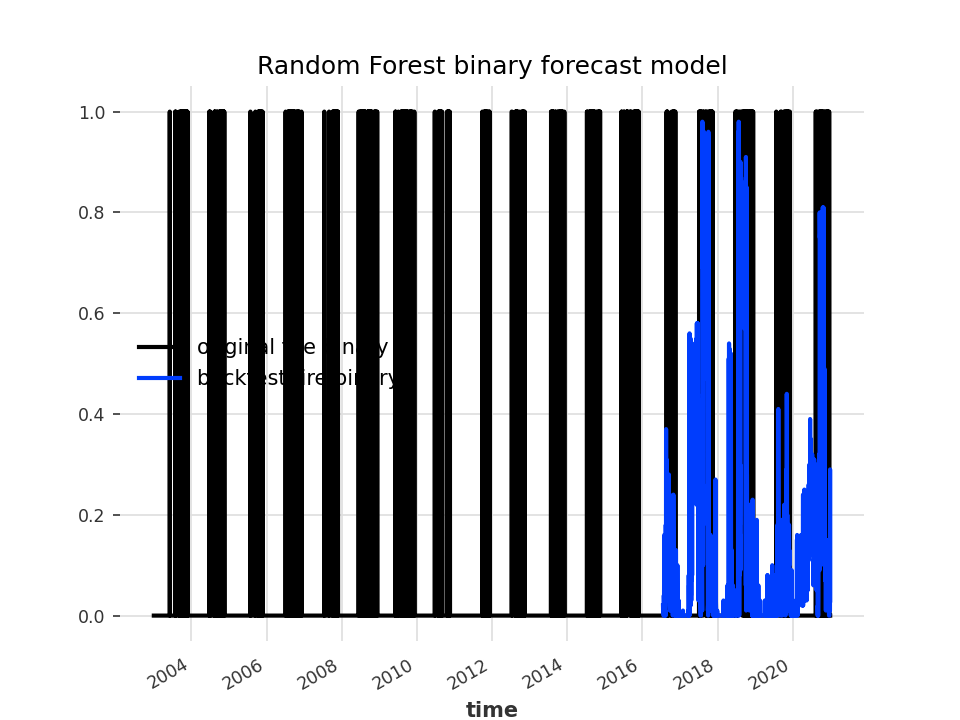

Text(0.5, 1.0, 'Random Forest binary forecast model')

In [750]:
plt.figure()

sfb.plot(label='original fire binary')
backtest_wi_rf2.plot(label='backtest fire binary')
plt.title('Random Forest binary forecast model')

In [751]:
a

NameError: name 'a' is not defined

# Run through manually each time series

## Fire counts

In [53]:
import ipywidgets as widgets
from IPython.display import display
from mpl_point_clicker import clicker

In [176]:
def onclick(event):
    ix, iy = event.xdata, event.ydata
    global time
    time = ix
    return

In [196]:
def plot_fir(i=0,lbl='land'):
    n = len(fir[i]['regions'][lbl])
    fig,ax = plt.subplots(n,1,figsize=[8,9])
    # Call click func
    #cid = fig.canvas.mpl_connect('button_press_event', onclick)
    klicker = []
    for j in range(n):
        ax[j].plot(fir[i]['doy'],fir[i]['FP'][lbl]['num'][:,j],'.-b')
        ax[j].set_title(lbl+': '+fir[i]['lbls_rg'][lbl][j])
        ax[j].axhline(15,color='lightgrey',linestyle='--')    
        #klicker.append(clicker(ax[j],["start", "peak", "end"], markers=["o", "x", "*"]))
    plt.show()
    plt.tight_layout(rect=(0,0,0.9,1))

In [197]:
def plotnext(b):
    #fire_times[dd] = [k.get_positions()[0] for k in klicker] 
    sl.value = sl.value +1
    if sl.value > 5:
        fig.canvas.mpl_disconnect('button_press_event')

def plot_update(b):
    fig = plot_fir()

In [201]:
button1 = widgets.Button(description="Next")
dd = widgets.Dropdown(options=fir[0]['FP'].keys())
sl = widgets.IntSlider(value=0,min=0,max=len(fir),step=1)
#out = widgets.Output()

#buttons = widgets.VBox(children=[button1,button2, dd])
#all_widgets = widgets.HBox(children=[buttons, out])
#display(all_widgets)
#fire_times = {}


    
    
button1.on_click(plotnext)
widgets.interact(plot_fir, lbl = dd, i=sl, __output_result=True)



display(button1)
#with out:
#    fig = plot_fir()
    #fig.show()

interactive(children=(IntSlider(value=0, description='i', max=19), Dropdown(description='lbl', options=('coast…

Button(description='Next', style=ButtonStyle())

## Filter for fire onset

In [46]:
au = np.where(fir[0]['FP']['coast']['num'][:,0]>20)[0]

In [69]:
# prep the arrays
fire_times = []
for i in range(len(fir)):
    fire_times.append({})

In [73]:
lbl = 'coast'
irg = 0 

<IPython.core.display.Javascript object>


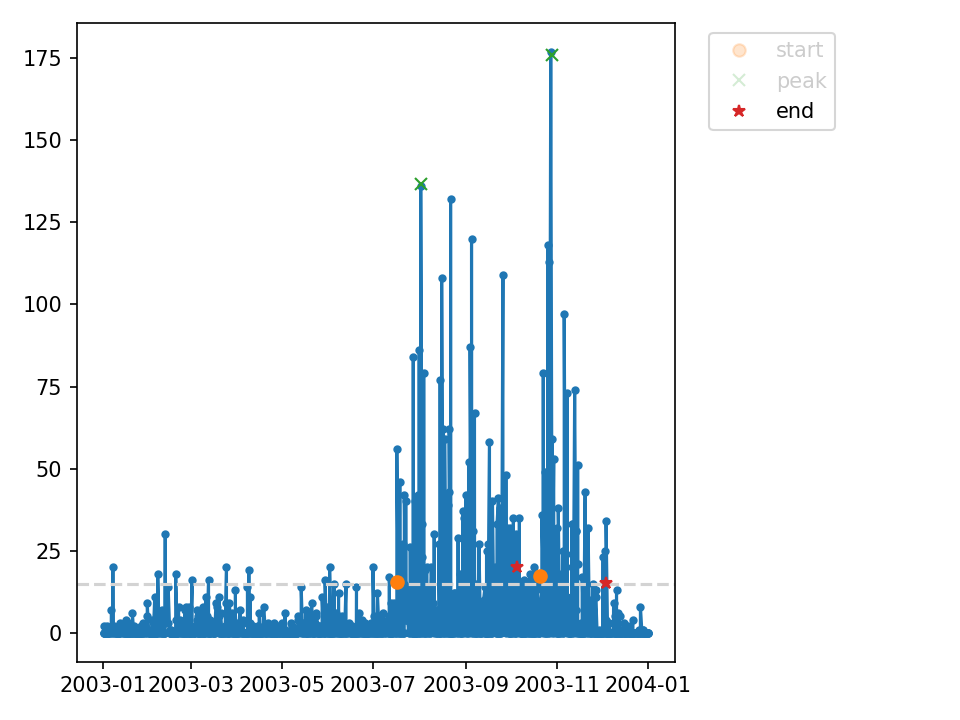

<IPython.core.display.Javascript object>


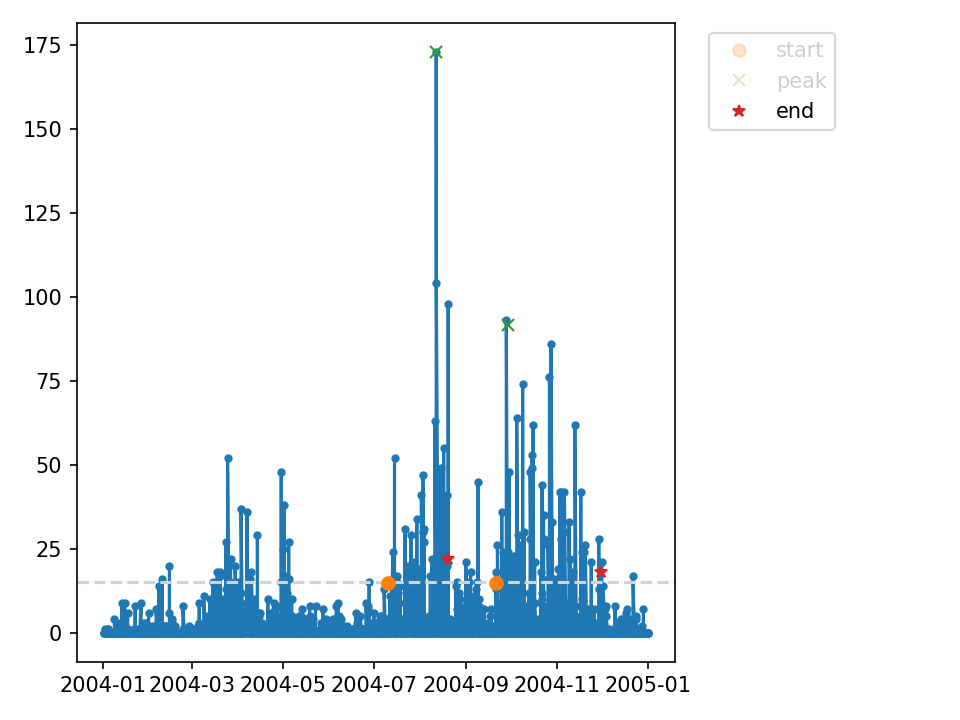

<IPython.core.display.Javascript object>


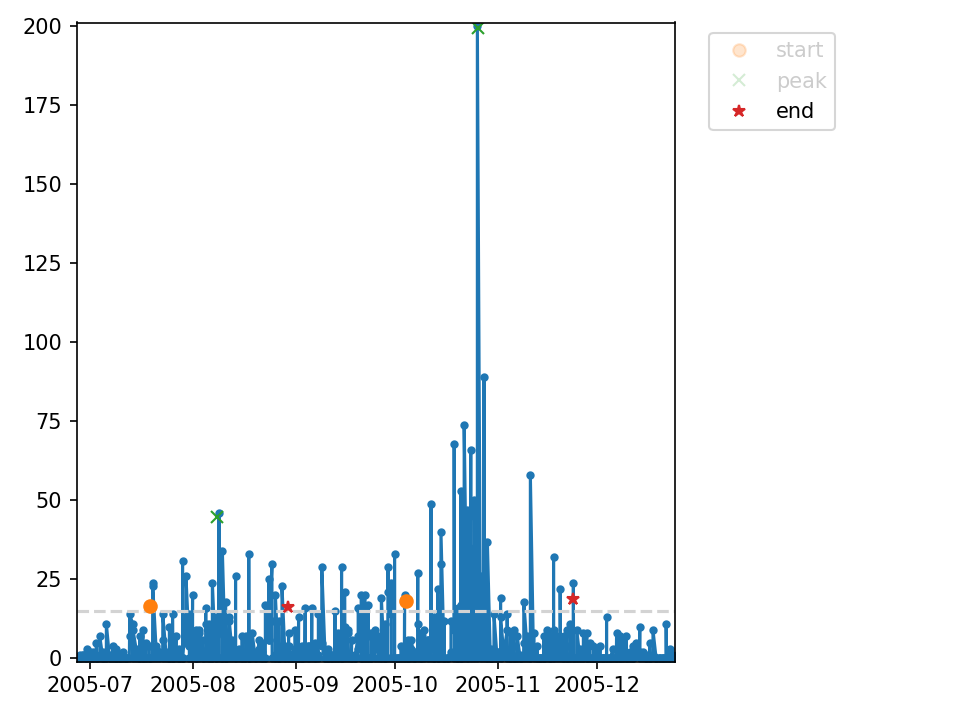

<IPython.core.display.Javascript object>


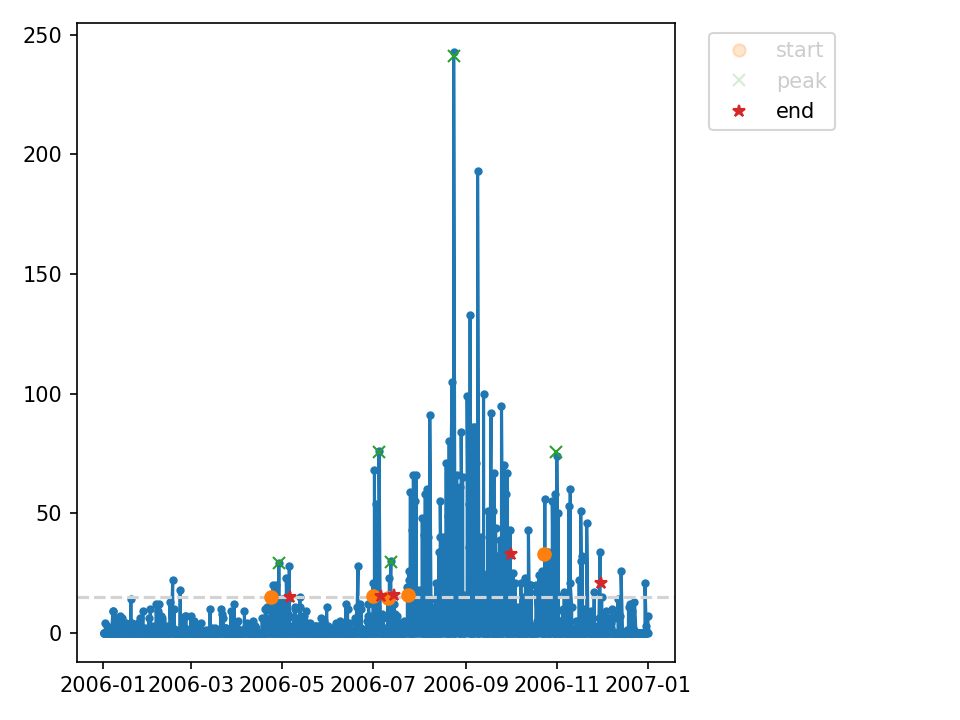

<IPython.core.display.Javascript object>


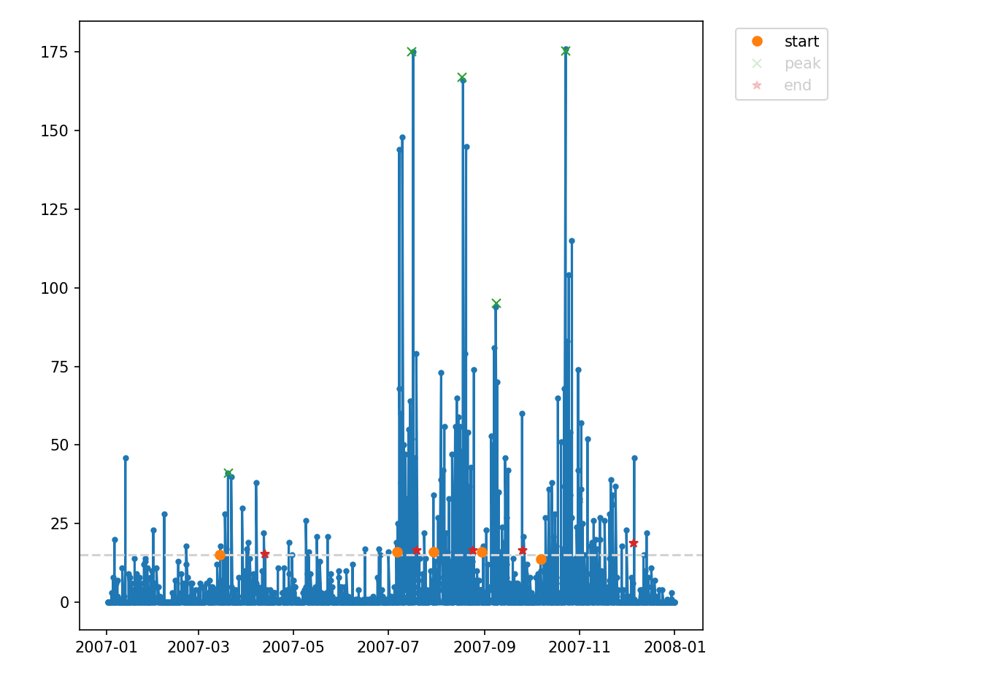

<IPython.core.display.Javascript object>


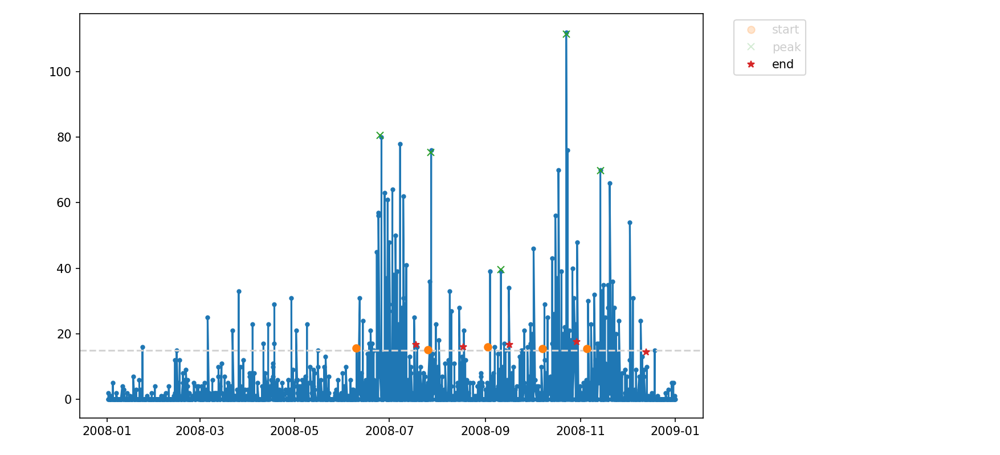

<IPython.core.display.Javascript object>


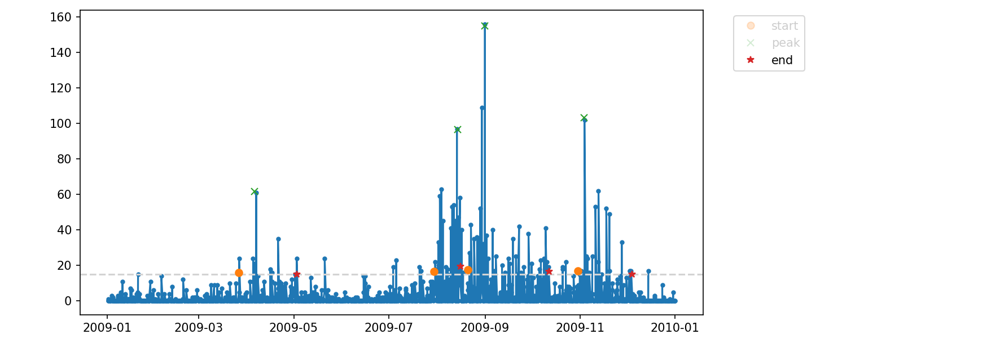

<IPython.core.display.Javascript object>


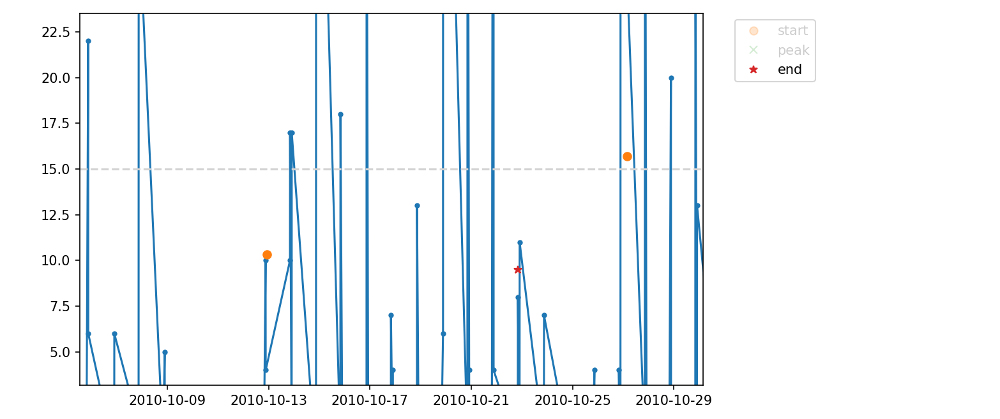

<IPython.core.display.Javascript object>


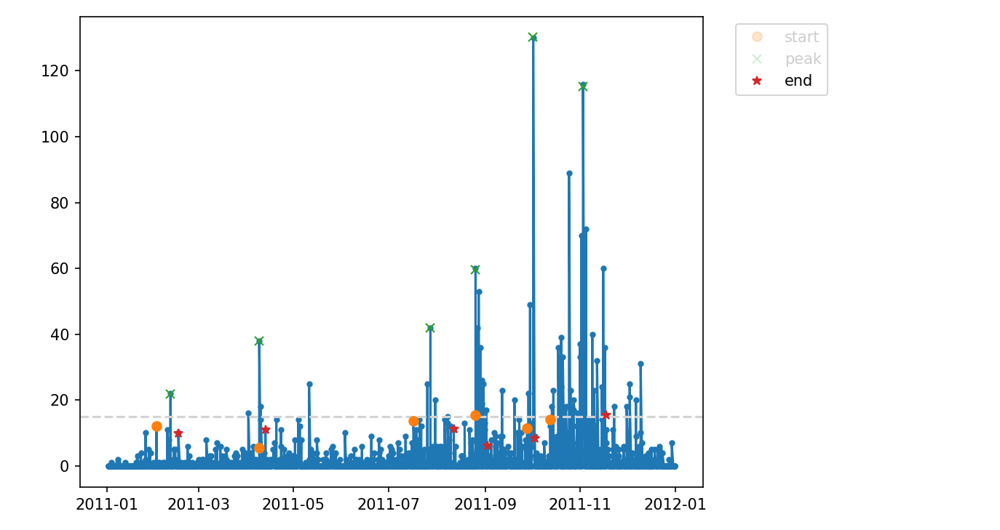

<IPython.core.display.Javascript object>


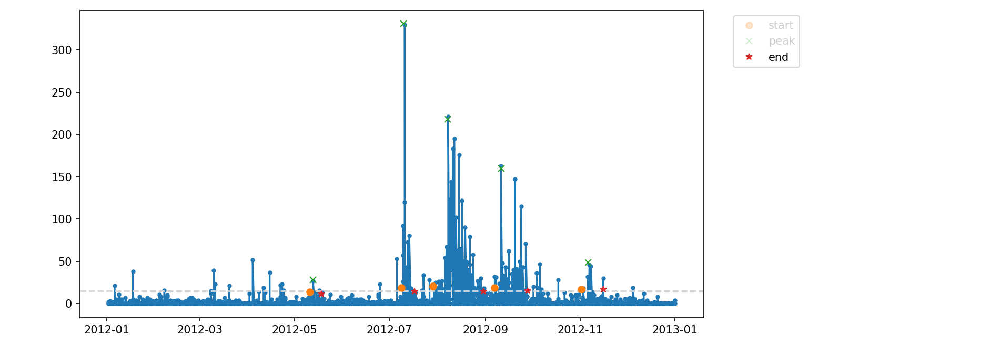

<IPython.core.display.Javascript object>


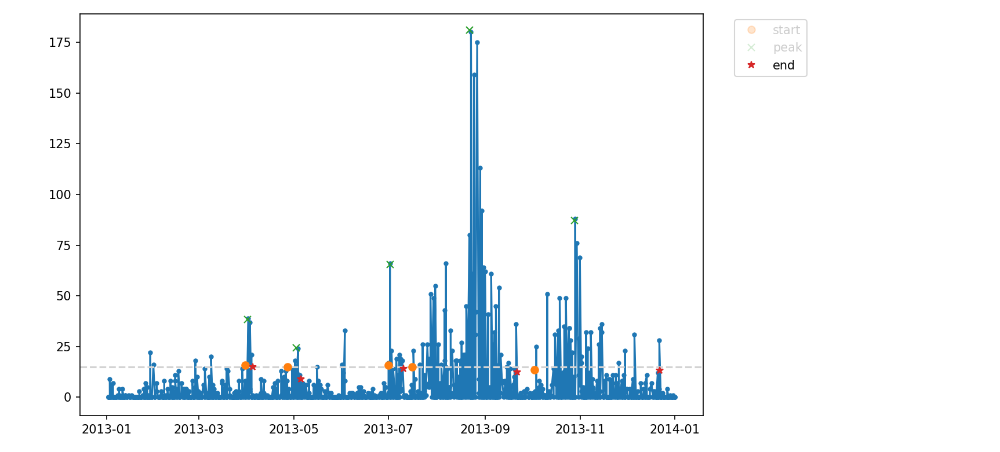

<IPython.core.display.Javascript object>


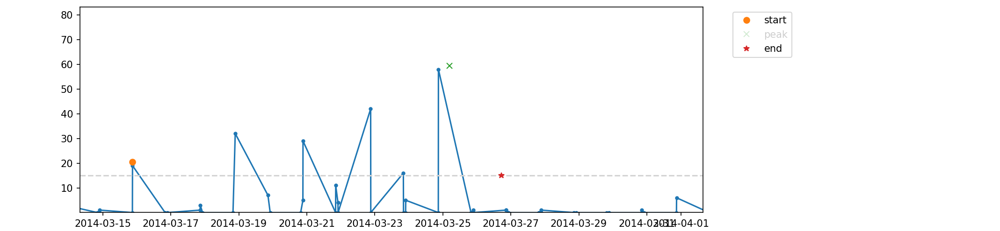

<IPython.core.display.Javascript object>


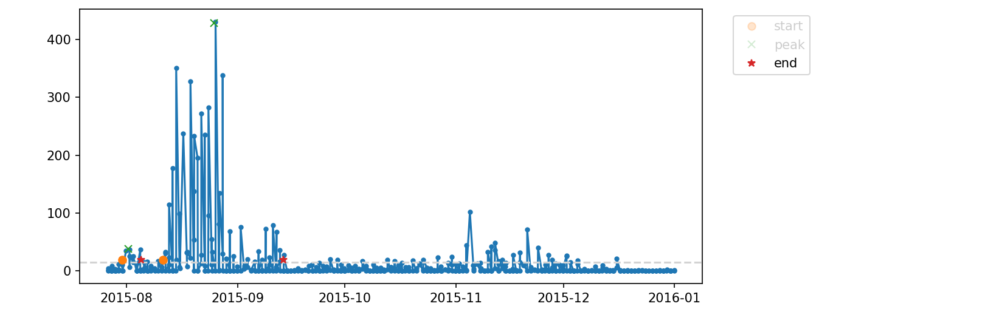

<IPython.core.display.Javascript object>


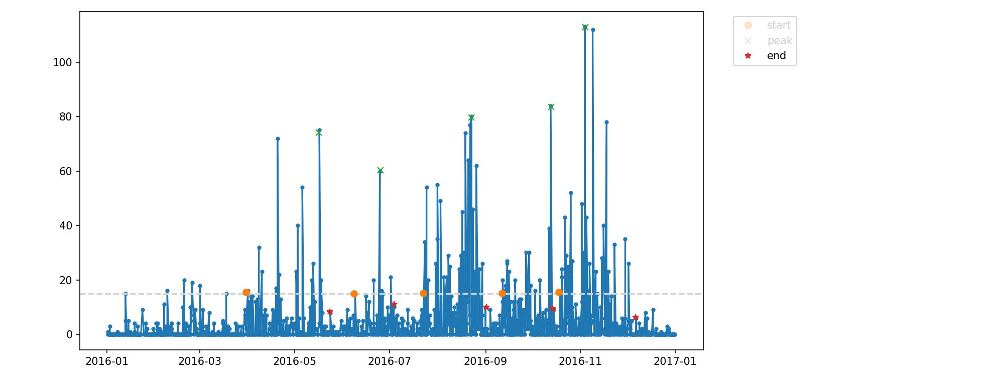

<IPython.core.display.Javascript object>


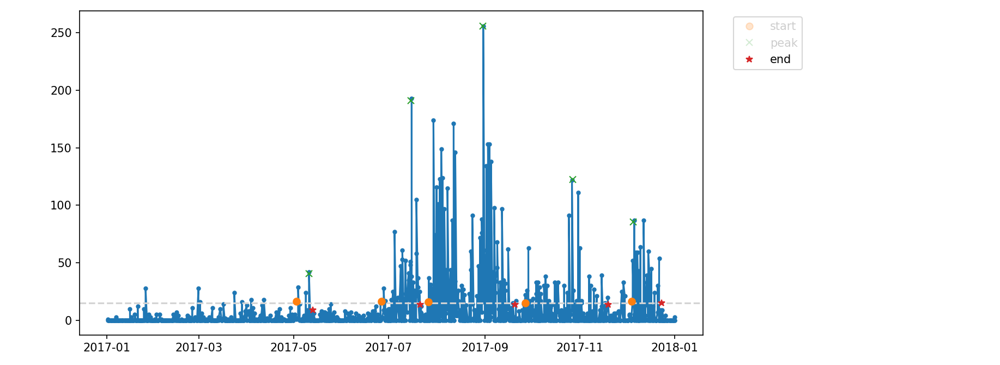

<IPython.core.display.Javascript object>


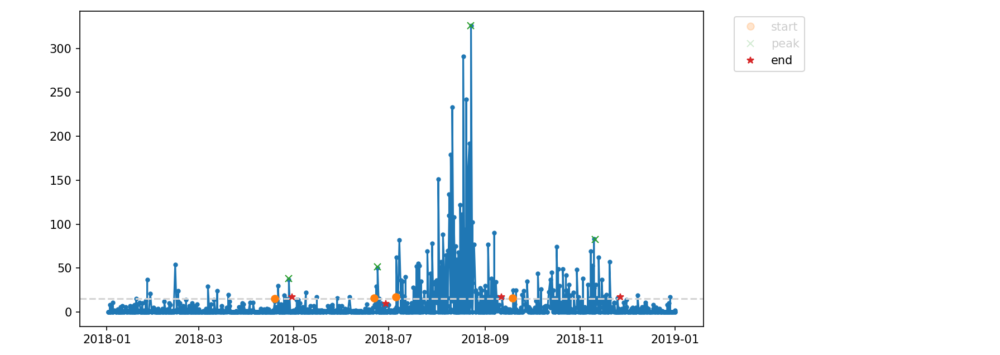

<IPython.core.display.Javascript object>


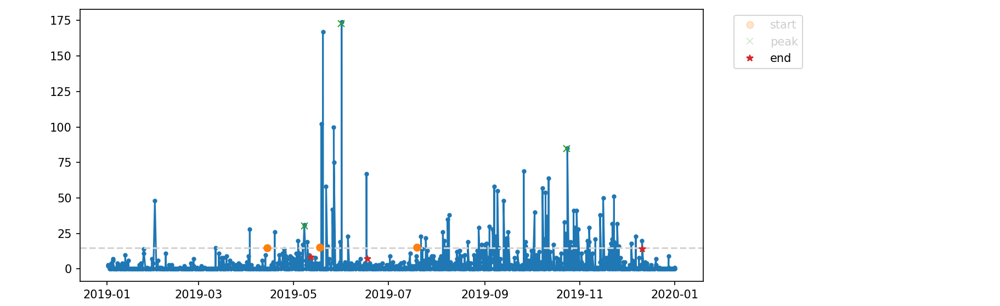

<IPython.core.display.Javascript object>


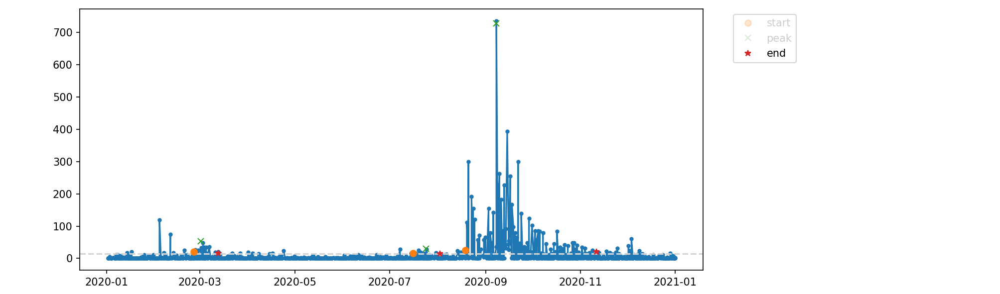

<IPython.core.display.Javascript object>


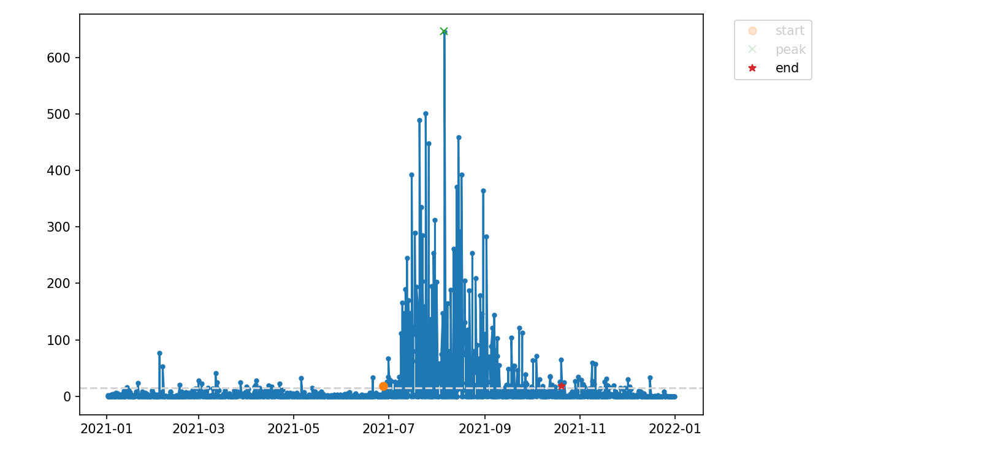

In [58]:
kl = []
for i,fi in list(enumerate(fir)):
    plt.figure(figsize=(12,4))
    plt.plot(fi['time'],fi['FP'][lbl]['num'][:,irg],'.-')
    plt.axhline(15,linestyle='--',color='lightgrey')
    kl.append(clicker(plt.gca(),["start", "peak", "end"], markers=["o", "x", "*"]))
    plt.tight_layout(rect=(0,0,0.95,1))
    plt.title(lbl)

In [84]:
for i in range(len(fir)):
    if not lbl in fire_times[i]: 
        fire_times[i][lbl] = []
        for j in range(len(fir[i]['FP'][lbl]['num'][0,:])):
            fire_times[i][lbl].append([])
    fire_times[i][lbl][irg] = kl[i].get_positions()

In [89]:
np.save(fp+'fire_times_manual.npy',fire_times,allow_pickle=True)

In [94]:
fire_times_from_save = np.load(fp+'fire_times_manual.npy',allow_pickle=True)